In [1]:
from hnn_core import calcium_model, read_params, simulate_dipole, average_dipoles
from hnn_core.viz import plot_dipole
import matplotlib.pyplot as plt
from copy import deepcopy
import pandas as pd
import pickle
import numpy as np
from hnn_core import MPIBackend

In [2]:
# load participant data 
df = pd.read_csv('HNN_data_TEP_dipole_0_300.txt', sep = ' ')
data = [line.split('\t') for line in df.iloc[:,0].tolist()]

partic_data = []
partic_data.append([float(x[0]) for x in data])
partic_data.append([float(x[1]) for x in data])

In [3]:
# load params from original param file
fparams = "TEP_from_def_Liz_2newInputs_optimized.param"
original_params = read_params(fparams)

print(original_params)

{
    "L2Basket_Gauss_A_weight": 0.0,
    "L2Basket_Gauss_mu": 2000.0,
    "L2Basket_Gauss_sigma": 3.6,
    "L2Basket_Pois_A_weight_ampa": 0.0,
    "L2Basket_Pois_A_weight_nmda": 0.0,
    "L2Basket_Pois_lamtha": 0.0,
    "L2Pyr_Gauss_A_weight": 0.0,
    "L2Pyr_Gauss_mu": 2000.0,
    "L2Pyr_Gauss_sigma": 3.6,
    "L2Pyr_Pois_A_weight_ampa": 0.0,
    "L2Pyr_Pois_A_weight_nmda": 0.0,
    "L2Pyr_Pois_lamtha": 0.0,
    "L2Pyr_ampa_e": 0.0,
    "L2Pyr_ampa_tau1": 0.5,
    "L2Pyr_ampa_tau2": 5.0,
    "L2Pyr_apical1_L": 306.0,
    "L2Pyr_apical1_diam": 4.08,
    "L2Pyr_apicaloblique_L": 340.0,
    "L2Pyr_apicaloblique_diam": 3.91,
    "L2Pyr_apicaltrunk_L": 59.5,
    "L2Pyr_apicaltrunk_diam": 4.25,
    "L2Pyr_apicaltuft_L": 238.0,
    "L2Pyr_apicaltuft_diam": 3.4,
    "L2Pyr_basal1_L": 85.0,
    "L2Pyr_basal1_diam": 4.25,
    "L2Pyr_basal2_L": 255.0,
    "L2Pyr_basal2_diam": 2.72,
    "L2Pyr_basal3_L": 255.0,
    "L2Pyr_basal3_diam": 2.72,
    "L2Pyr_dend_Ra": 200.0,
    "L2Pyr_dend_cm": 0.619

In [4]:
def make_net_and_simulate(params, n_trials = 2, tstop=None):
    # make nets
    net = calcium_model(params=params, add_drives_from_params=True)

    # simulate dipoles
    if tstop is not None:
        with MPIBackend(n_procs=n_trials, mpi_cmd='mpiexec'):
            dpl = simulate_dipole(net, tstop=tstop, n_trials=n_trials)
    else: 
        with MPIBackend(n_procs=n_trials, mpi_cmd='mpiexec'):
            dpl = simulate_dipole(net, tstop=params["tstop"], n_trials=n_trials)
    return dpl, net


In [5]:
from hnn_core import jones_2009_model

def make_net_and_simulate_jones2009(params, n_trials = 2, tstop=None):
    # make nets
    net = jones_2009_model(params=params, add_drives_from_params=True)

    # simulate dipoles
    if tstop is not None:
        with MPIBackend(n_procs=n_trials, mpi_cmd='mpiexec'):
            dpl = simulate_dipole(net, tstop=tstop, n_trials=n_trials)
    else: 
        with MPIBackend(n_procs=n_trials, mpi_cmd='mpiexec'):
            dpl = simulate_dipole(net, tstop=params["tstop"], n_trials=n_trials)
    return dpl, net


In [6]:
def scale_and_smooth(dpls_list, window_len = 10, scaling_factor = 1):
    dpl_smoothed_list = [deepcopy(dpl) for dpl in dpls_list]
    for dpl in dpl_smoothed_list:
        for dpl_trial in dpl:
            dpl_trial.smooth(window_len).scale(scaling_factor)
    return dpl_smoothed_list

In [ ]:
def make_plot(dpls, nets, scalars, data_scale=4, tstop=320, title_list = None, trial_idx = 0):
    for i in range(len(dpls)):
        fig, axes = plt.subplots(3, 2, sharex=True, figsize=(16, 12), constrained_layout=True)

        # plot 1: drives
        nets[i].cell_response.plot_spikes_hist(ax=axes[0][0], spike_types=['evprox', 'evdist'], trial_idx=trial_idx, show=False)

        # plot 2: cell response
        nets[i].cell_response.plot_spikes_hist(ax=axes[1][0], spike_types=['L5_pyramidal', 'L2_pyramidal', 'L5_basket', 'L2_basket', ], trial_idx=trial_idx, show=False)

        # plot 3: cell spiking
        nets[i].cell_response.plot_spikes_raster(ax=axes[2][0], trial_idx=trial_idx, show=False)

        # plot 4: dipole, agg and data 
        plot_dipole(dpls[i], ax = axes[0][1], layer='agg', show=False)
        axes[0][1].plot(np.array(partic_data[0][:tstop]), np.array(partic_data[1][:tstop])*data_scale)
        axes[0][1].set_xlim(0,tstop)
        ymin, ymax = axes[0][1].get_ylim()

        # plot 5: dipole, layer 2/3
        plot_dipole(dpls[i], ax = axes[1][1], layer='L2', show=False)
        axes[1][1].set_ylim(ymin, ymax)

        # plot 6: dipole, layer 5
        plot_dipole(dpls[i], ax = axes[2][1], layer='L5', show=False)
        axes[2][1].set_ylim(ymin, ymax)

        if title_list is None:
            fig.suptitle(f'scalar {scalars[i]}')
        else:
            fig.suptitle(title_list[i])

<h1>Final

In [37]:
# load params from hand-tuned param file
with open('param_files/net_TEP_calcium_params.pkl', 'rb') as f:
    handtune_params = pickle.load(f)

print(handtune_params)

{
    "L2Basket_Gauss_A_weight": 0.0,
    "L2Basket_Gauss_mu": 2000.0,
    "L2Basket_Gauss_sigma": 3.6,
    "L2Basket_Pois_A_weight_ampa": 0.0,
    "L2Basket_Pois_A_weight_nmda": 0.0,
    "L2Basket_Pois_lamtha": 0.0,
    "L2Pyr_Gauss_A_weight": 0.0,
    "L2Pyr_Gauss_mu": 2000.0,
    "L2Pyr_Gauss_sigma": 3.6,
    "L2Pyr_Pois_A_weight_ampa": 0.0,
    "L2Pyr_Pois_A_weight_nmda": 0.0,
    "L2Pyr_Pois_lamtha": 0.0,
    "L2Pyr_ampa_e": 0.0,
    "L2Pyr_ampa_tau1": 0.5,
    "L2Pyr_ampa_tau2": 5.0,
    "L2Pyr_apical1_L": 306.0,
    "L2Pyr_apical1_diam": 4.08,
    "L2Pyr_apicaloblique_L": 340.0,
    "L2Pyr_apicaloblique_diam": 3.91,
    "L2Pyr_apicaltrunk_L": 59.5,
    "L2Pyr_apicaltrunk_diam": 4.25,
    "L2Pyr_apicaltuft_L": 238.0,
    "L2Pyr_apicaltuft_diam": 3.4,
    "L2Pyr_basal1_L": 85.0,
    "L2Pyr_basal1_diam": 4.25,
    "L2Pyr_basal2_L": 255.0,
    "L2Pyr_basal2_diam": 2.72,
    "L2Pyr_basal3_L": 255.0,
    "L2Pyr_basal3_diam": 2.72,
    "L2Pyr_dend_Ra": 200.0,
    "L2Pyr_dend_cm": 0.619

In [22]:
TEP_dpl, TEP_net = make_net_and_simulate(handtune_params,n_trials=4)
smoothed_TEP_dpl = scale_and_smooth([TEP_dpl])

MPI will run 4 trial(s) sequentially by distributing network neurons over 4 processes.
numprocs=4
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/h

In [35]:
TEP_dpl, TEP_net = make_net_and_simulate_jones2009(handtune_params,n_trials=2)
smoothed_TEP_dpl = scale_and_smooth([TEP_dpl],window_len=1)

MPI will run 2 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Trial 1: 50.0 ms...
Trial 1: 60.0 ms...
Trial 1: 70.0 ms...
Trial 1: 80.0 ms...
Trial 1: 90.0 ms...
T

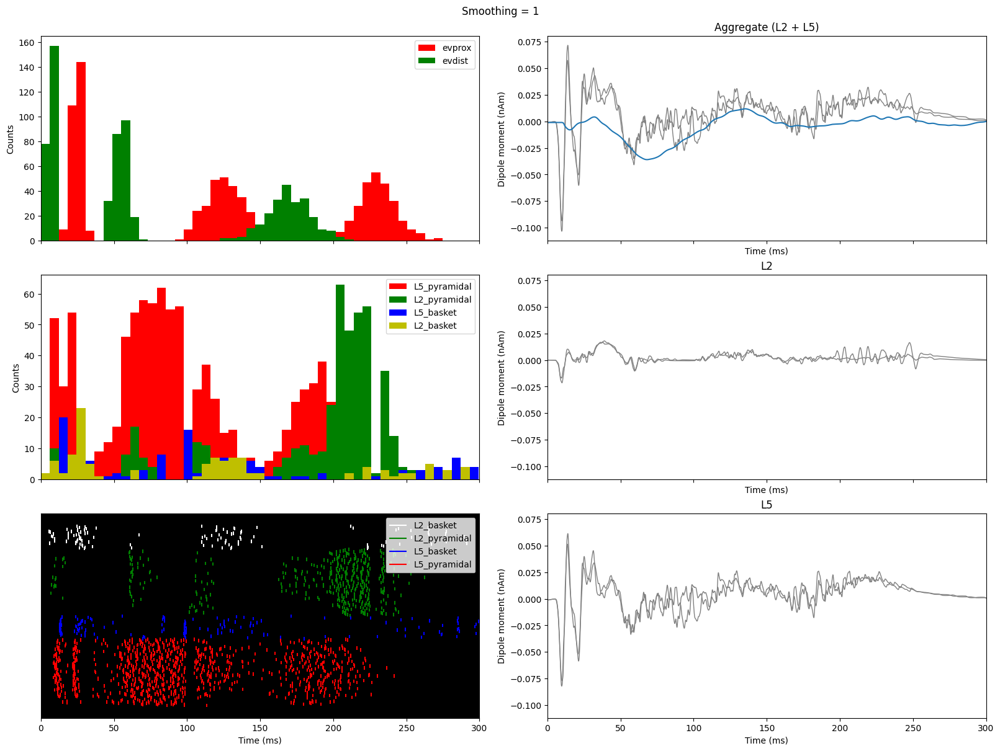

In [36]:
smoothed_TEP_dpl = scale_and_smooth([TEP_dpl],window_len=1)
make_plot(smoothed_TEP_dpl, [TEP_net], [0], title_list=['Smoothing = 1'], tstop=300,trial_idx=1)

<h1>Original params</h1>

In [32]:
original_dpl, original_net = make_net_and_simulate(original_params)
smoothed_origina_dpl = scale_and_smooth([original_dpl])


MPI will run 2 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Trial 1: 50.0 ms...
Trial 1: 60.0 ms...
Trial 1: 70.0 ms...
Trial 1: 80.0 ms...
Trial 1: 90.0 ms...
T

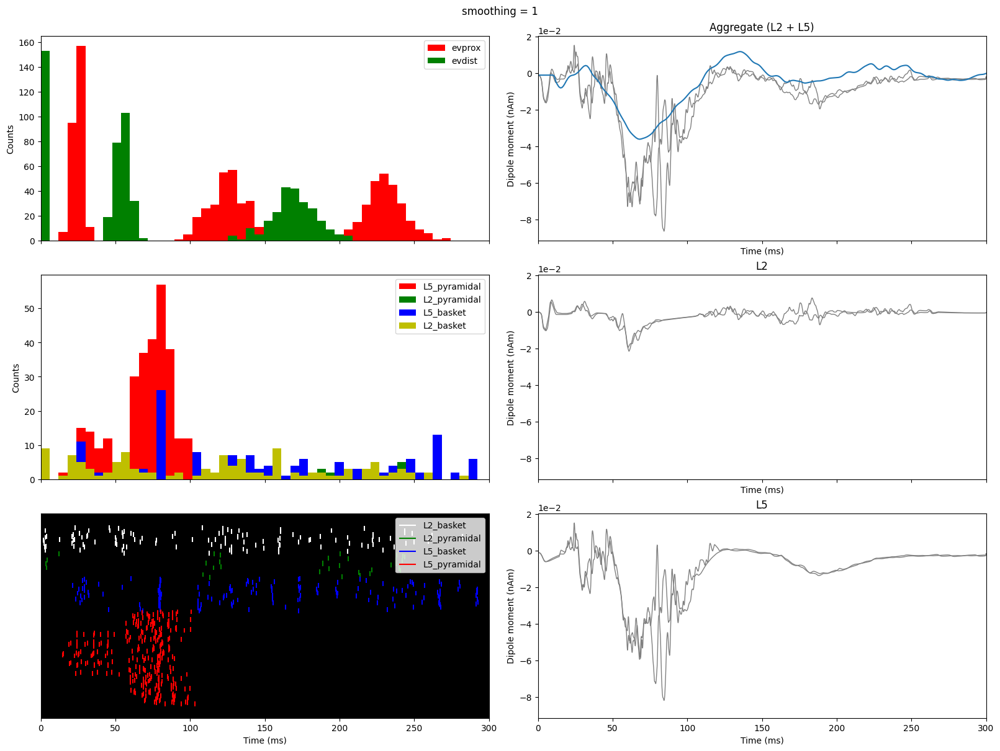

In [34]:
smoothed_origina_dpl = scale_and_smooth([original_dpl], window_len=1)
make_plot(smoothed_origina_dpl, [original_net], [0], tstop=300, title_list=['smoothing = 1'])

In [10]:
original_dpl, original_net = make_net_and_simulate(original_params, tstop=50)

MPI will run 2 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Building the NEURON model
[Done]
Trial 2: 0.03 ms...
Trial 2: 10.0 ms...
Trial 2: 20.0 ms...
Trial 2:

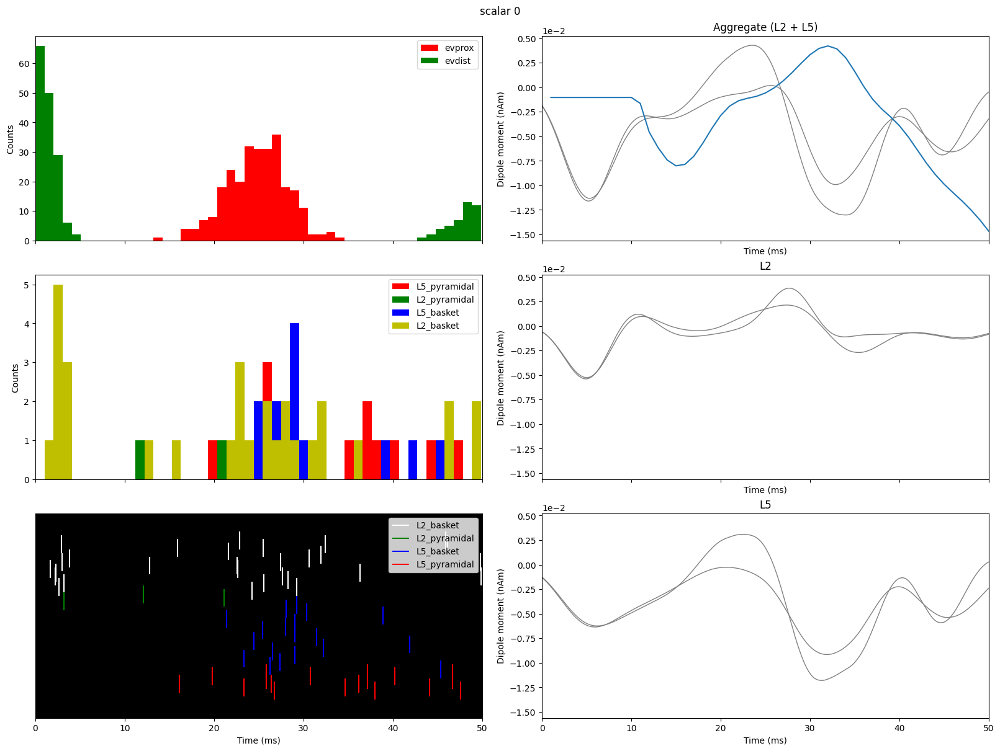

In [11]:
smoothed_origina_dpl = scale_and_smooth([original_dpl])
make_plot(smoothed_origina_dpl, [original_net], [0], tstop=50)

<h1>add another dist drive

In [18]:
dist4_params = deepcopy(original_params)
dist4_params.update({
    "gbar_evdist_4_L2Basket_ampa": 0.002217,
    "gbar_evdist_4_L2Basket_nmda": 0.035139,
    "gbar_evdist_4_L2Pyr_ampa": 0.002819,
    "gbar_evdist_4_L2Pyr_nmda": 0.003713,
    "gbar_evdist_4_L5Pyr_ampa": 0.027627,
    "gbar_evdist_4_L5Pyr_nmda": 0.005384,
    "numspikes_evdist_4": 1,
    "prng_seedcore_evdist_4": 0,
    "sigma_t_evdist_4": 1.434398,
    "t_evdist_4": 3.528485})
dist4_params

{
    "L2Basket_Gauss_A_weight": 0.0,
    "L2Basket_Gauss_mu": 2000.0,
    "L2Basket_Gauss_sigma": 3.6,
    "L2Basket_Pois_A_weight_ampa": 0.0,
    "L2Basket_Pois_A_weight_nmda": 0.0,
    "L2Basket_Pois_lamtha": 0.0,
    "L2Pyr_Gauss_A_weight": 0.0,
    "L2Pyr_Gauss_mu": 2000.0,
    "L2Pyr_Gauss_sigma": 3.6,
    "L2Pyr_Pois_A_weight_ampa": 0.0,
    "L2Pyr_Pois_A_weight_nmda": 0.0,
    "L2Pyr_Pois_lamtha": 0.0,
    "L2Pyr_ampa_e": 0.0,
    "L2Pyr_ampa_tau1": 0.5,
    "L2Pyr_ampa_tau2": 5.0,
    "L2Pyr_apical1_L": 306.0,
    "L2Pyr_apical1_diam": 4.08,
    "L2Pyr_apicaloblique_L": 340.0,
    "L2Pyr_apicaloblique_diam": 3.91,
    "L2Pyr_apicaltrunk_L": 59.5,
    "L2Pyr_apicaltrunk_diam": 4.25,
    "L2Pyr_apicaltuft_L": 238.0,
    "L2Pyr_apicaltuft_diam": 3.4,
    "L2Pyr_basal1_L": 85.0,
    "L2Pyr_basal1_diam": 4.25,
    "L2Pyr_basal2_L": 255.0,
    "L2Pyr_basal2_diam": 2.72,
    "L2Pyr_basal3_L": 255.0,
    "L2Pyr_basal3_diam": 2.72,
    "L2Pyr_dend_Ra": 200.0,
    "L2Pyr_dend_cm": 0.619

In [20]:
dist4_dpl = []
dist4_net = []

for params in [dist4_params]:
    dpl, net = make_net_and_simulate(params)
    dist4_dpl.append(dpl)
    dist4_net.append(net)
smoothed_dist4_dpl = scale_and_smooth(dist4_dpl)

MPI will run 2 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Trial 1: 50.0 ms...
Trial 1: 60.0 ms...
Trial 1: 70.0 ms...
Trial 1: 80.0 ms...
Trial 1: 90.0 ms...
T

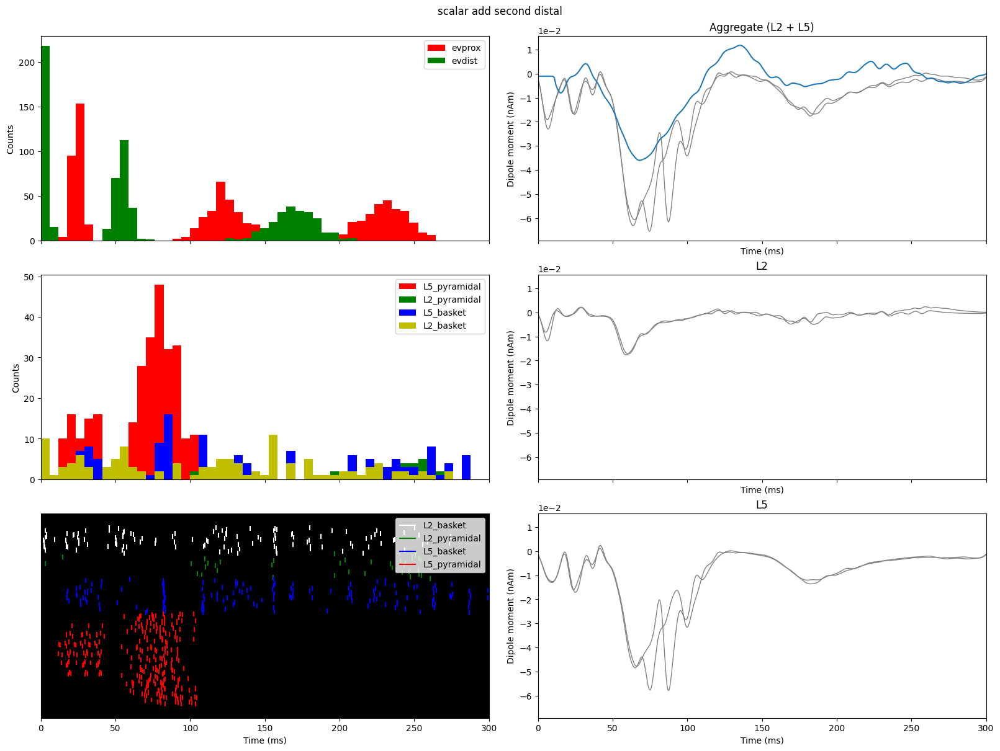

In [21]:
make_plot(smoothed_dist4_dpl, dist4_net, ['add second distal'], tstop=300)

<h1>increase dist1 time

In [13]:
prox1_time_params = deepcopy(original_params)

# delay the time of dist1 inputs 
dist1_t_scalar = [2, 4, 6]
dist1_t_params = [deepcopy(original_params) for _ in range(len(dist1_t_scalar))]

for params, scalar in zip(dist1_t_params, dist1_t_scalar):
    params['t_evdist_2'] = scalar + params['t_evdist_2']

In [14]:
dist1_t_dpl = []
dist1_t_net = []

for params in dist1_t_params:
    dpl, net = make_net_and_simulate(params)
    dist1_t_dpl.append(dpl)
    dist1_t_net.append(net)
smoothed_prox1_t_dpl = scale_and_smooth(dist1_t_dpl)

MPI will run 2 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Trial 1: 50.0 ms...
Trial 1: 60.0 ms...
Trial 1: 70.0 ms...
Trial 1: 80.0 ms...
Trial 1: 90.0 ms...
T

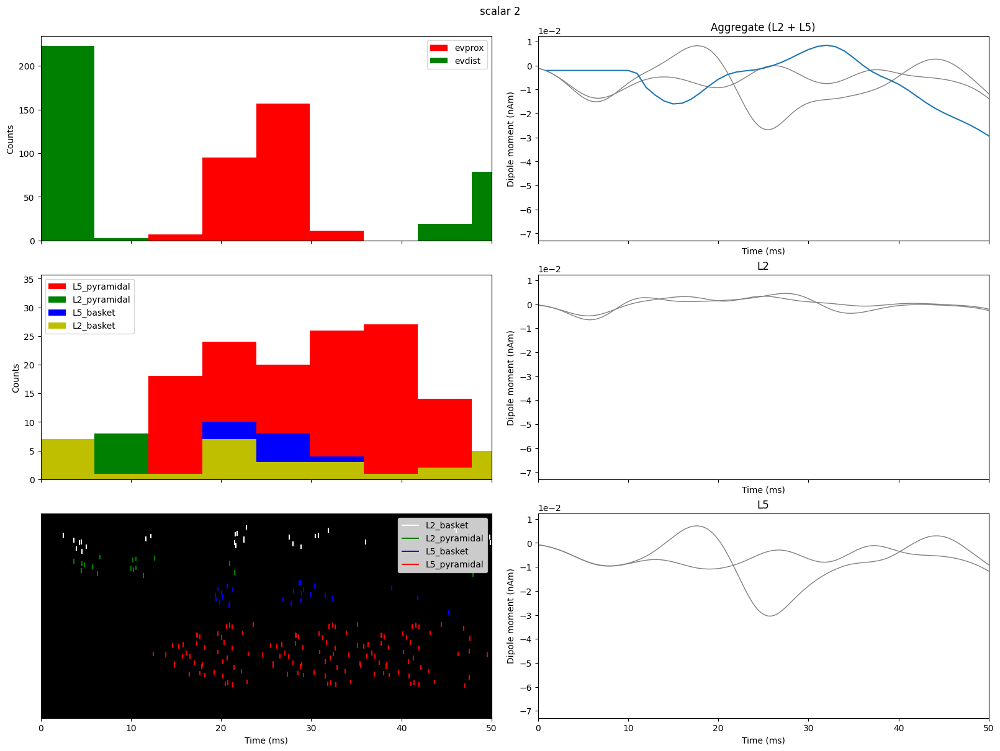

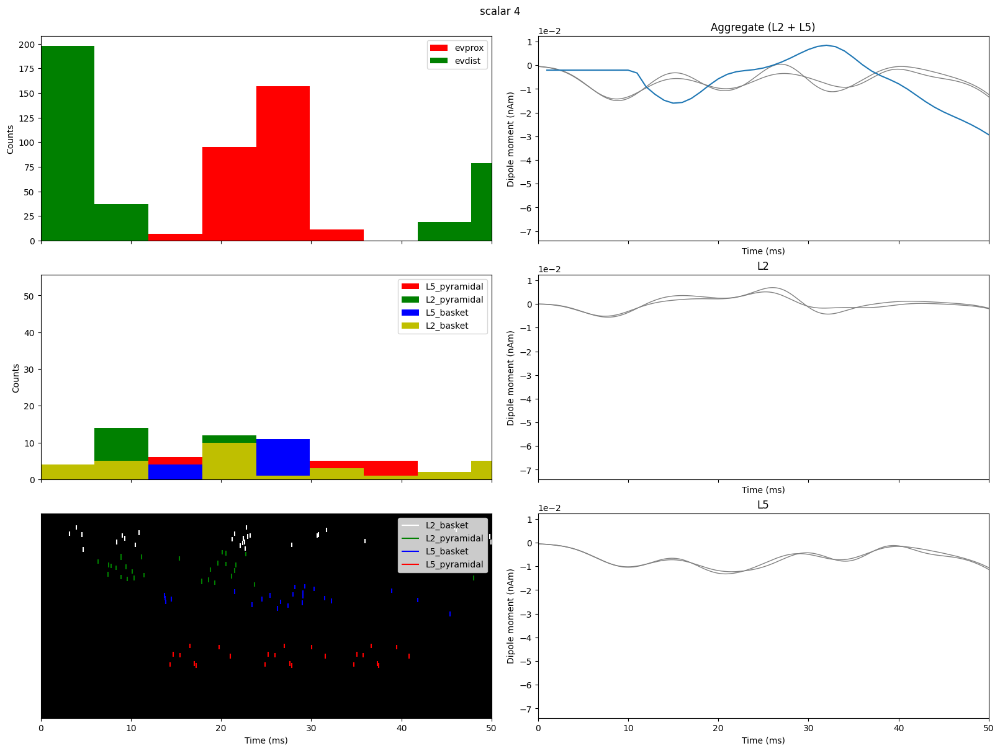

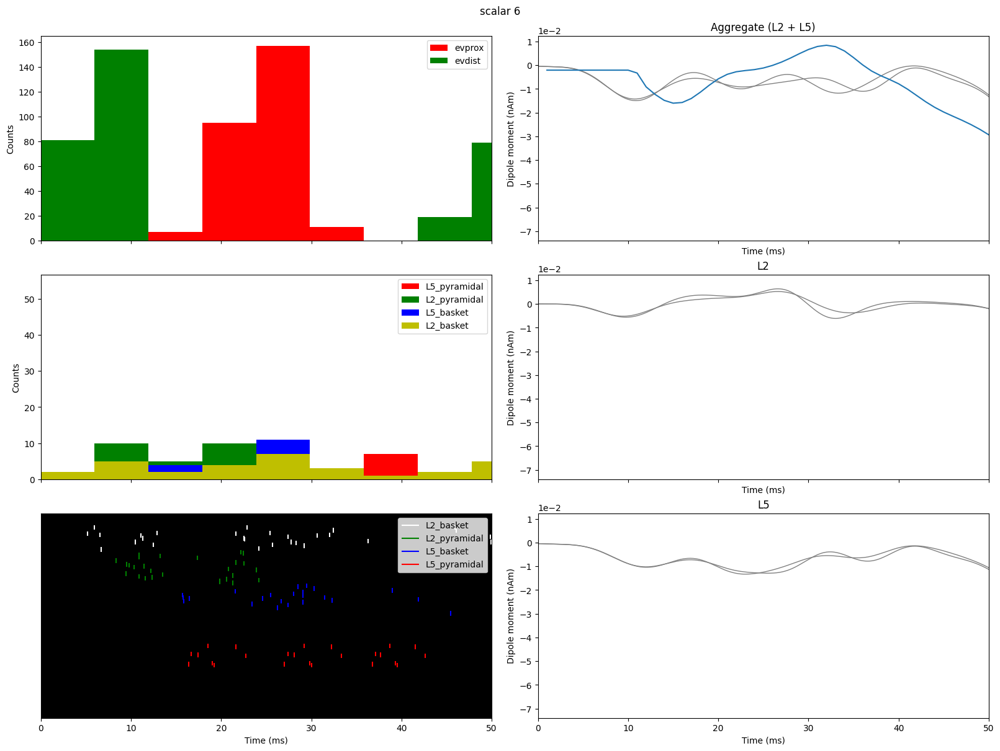

In [15]:
make_plot(smoothed_prox1_t_dpl, dist1_t_net, dist1_t_scalar, tstop=50)

<h1>Increase dist1 drive

In [163]:
# scale up the dist_1 drives 
dist_1_scalars = [2,3]

dist1_params_list = [deepcopy(dist1_t_params[2]) for _ in range(len(dist_1_scalars))]
# dist1_params_list = [deepcopy(original_params) for _ in range(len(dist_1_scalars))]


for params, scalar in zip(dist1_params_list, dist_1_scalars):
    for param in params['gbar_evdist_2*']:
        params[param] = scalar * params[param]
        

print(dist1_params_list[0]['gbar_evdist_2*'])    
print(dist1_params_list[1]['gbar_evdist_2*'])

{
    "gbar_evdist_2_L2Basket_ampa": 0.004434,
    "gbar_evdist_2_L2Basket_nmda": 0.070278,
    "gbar_evdist_2_L2Pyr_ampa": 0.005638,
    "gbar_evdist_2_L2Pyr_nmda": 0.007426,
    "gbar_evdist_2_L5Pyr_ampa": 0.055254,
    "gbar_evdist_2_L5Pyr_nmda": 0.010768
}
{
    "gbar_evdist_2_L2Basket_ampa": 0.006650999999999999,
    "gbar_evdist_2_L2Basket_nmda": 0.10541699999999998,
    "gbar_evdist_2_L2Pyr_ampa": 0.008457,
    "gbar_evdist_2_L2Pyr_nmda": 0.011139,
    "gbar_evdist_2_L5Pyr_ampa": 0.082881,
    "gbar_evdist_2_L5Pyr_nmda": 0.016152
}


In [164]:
dist1_increase_dpl = []
dist1_increase_net = []

for params in dist1_params_list:
    dpl, net = make_net_and_simulate(params)
    dist1_increase_dpl.append(dpl)
    dist1_increase_net.append(net)
smoothed_dist1_increase_dpl = scale_and_smooth(dist1_increase_dpl)

MPI will run 2 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Trial 1: 50.0 ms...
Trial 1: 60.0 ms...
Trial 1: 70.0 ms...
Trial 1: 80.0 ms...
Trial 1: 90.0 ms...
T

In [167]:
smoothed_dist1_increase_dpl = scale_and_smooth(dist1_increase_dpl, window_len=30)

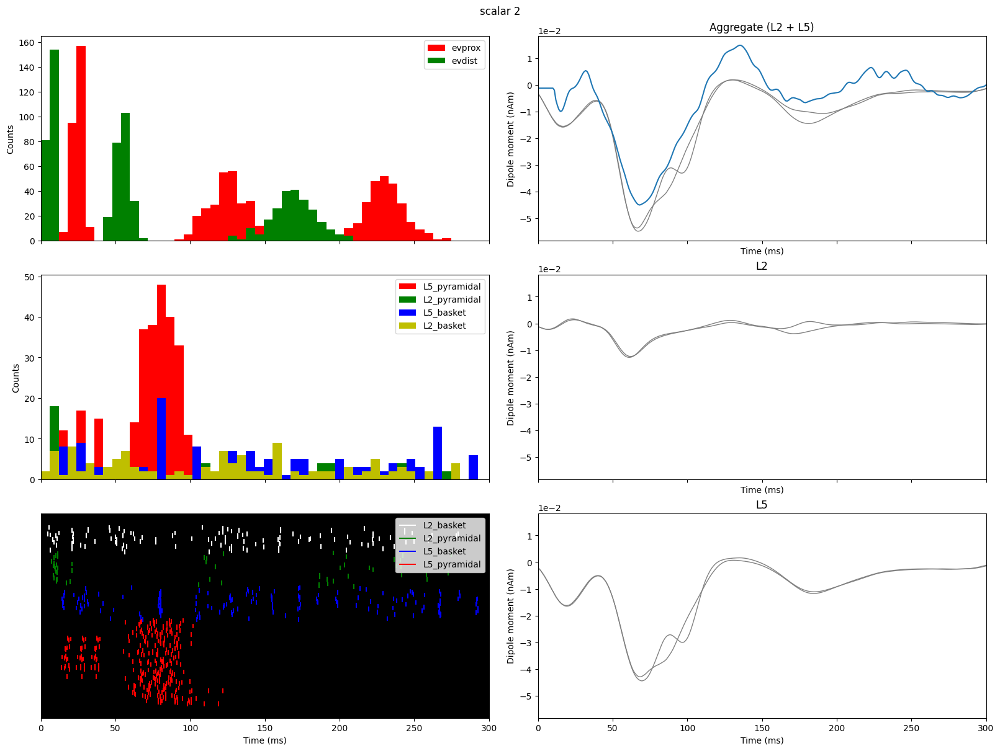

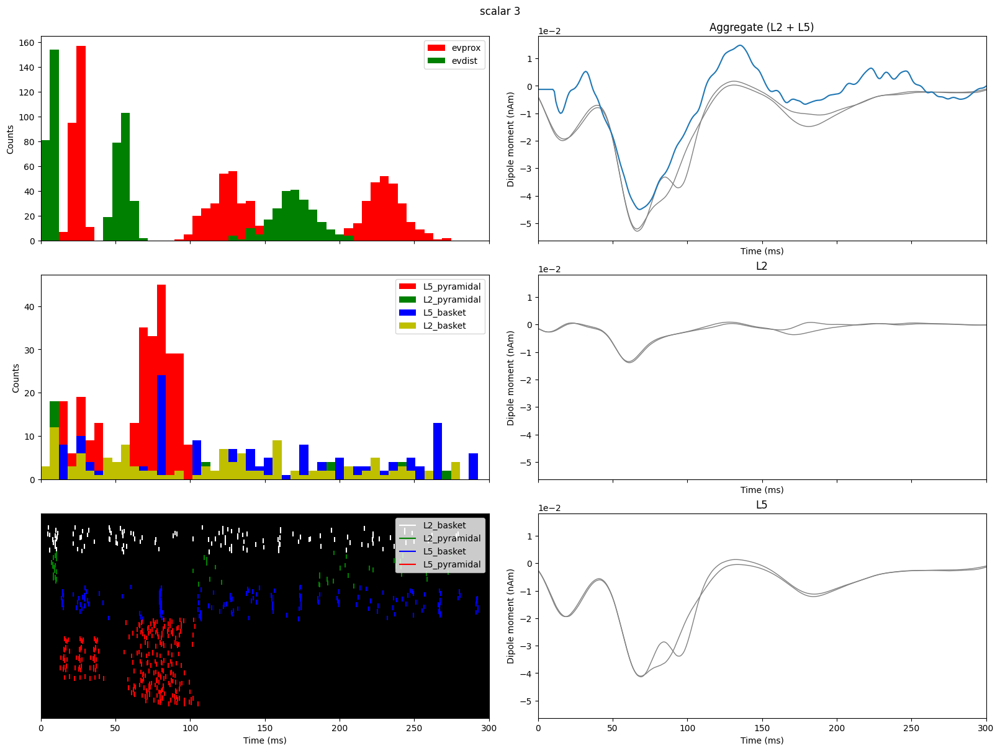

In [168]:
make_plot(smoothed_dist1_increase_dpl, dist1_increase_net, dist_1_scalars, tstop=300)

<h1> decrease dist1 SD

In [169]:
# sigma_t_evdist_2

dist_1_sd_scalars = [0.5, 0.7]

dist1_sd_params_list = [deepcopy(dist1_params_list[1]) for _ in range(len(dist_1_sd_scalars))]
# dist1_sd_params_list = [deepcopy(original_params) for _ in range(len(dist_1_sd_scalars))]

for params, scalar in zip(dist1_sd_params_list, dist_1_sd_scalars):
    params['sigma_t_evdist_2'] = scalar * params['sigma_t_evdist_2']
        

print(dist1_sd_params_list[0]['sigma_t_evdist_2'])    
print(dist1_sd_params_list[1]['sigma_t_evdist_2'])

0.717199
1.0040786


In [170]:
dist1_sd_increase_dpl = []
dist1_sd_increase_net = []

for params in dist1_sd_params_list:
    dpl, net = make_net_and_simulate(params)
    dist1_sd_increase_dpl.append(dpl)
    dist1_sd_increase_net.append(net)
smoothed_sd_dist1_increase_dpl = scale_and_smooth(dist1_sd_increase_dpl)

MPI will run 2 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Trial 1: 50.0 ms...
Trial 1: 60.0 ms...
Trial 1: 70.0 ms...
Trial 1: 80.0 ms...
Trial 1: 90.0 ms...
T

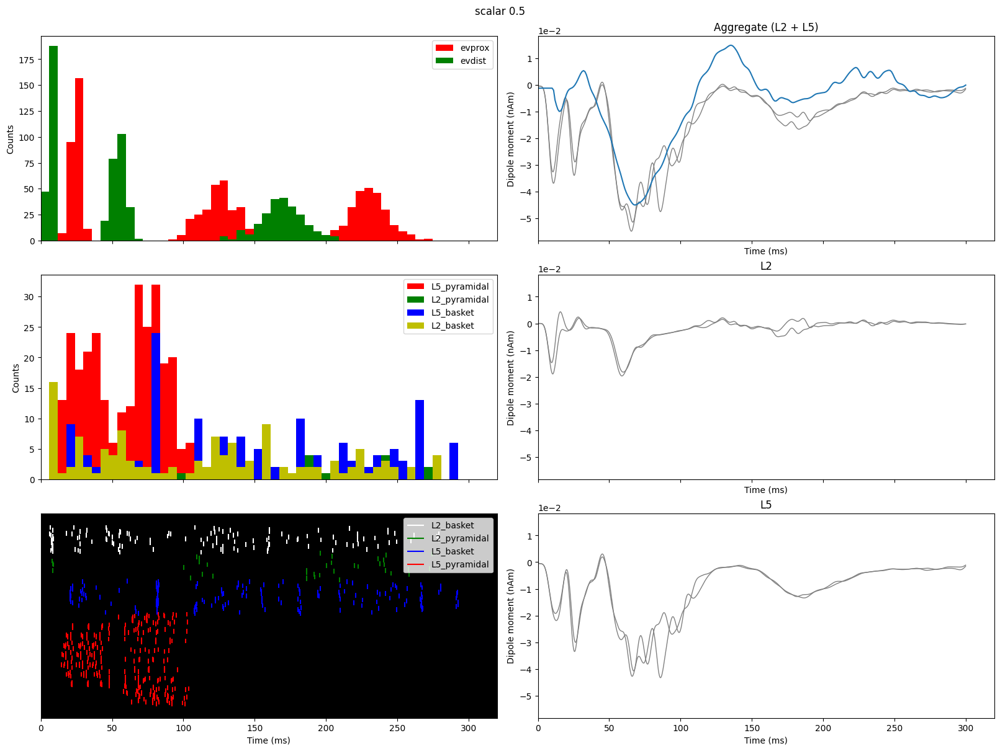

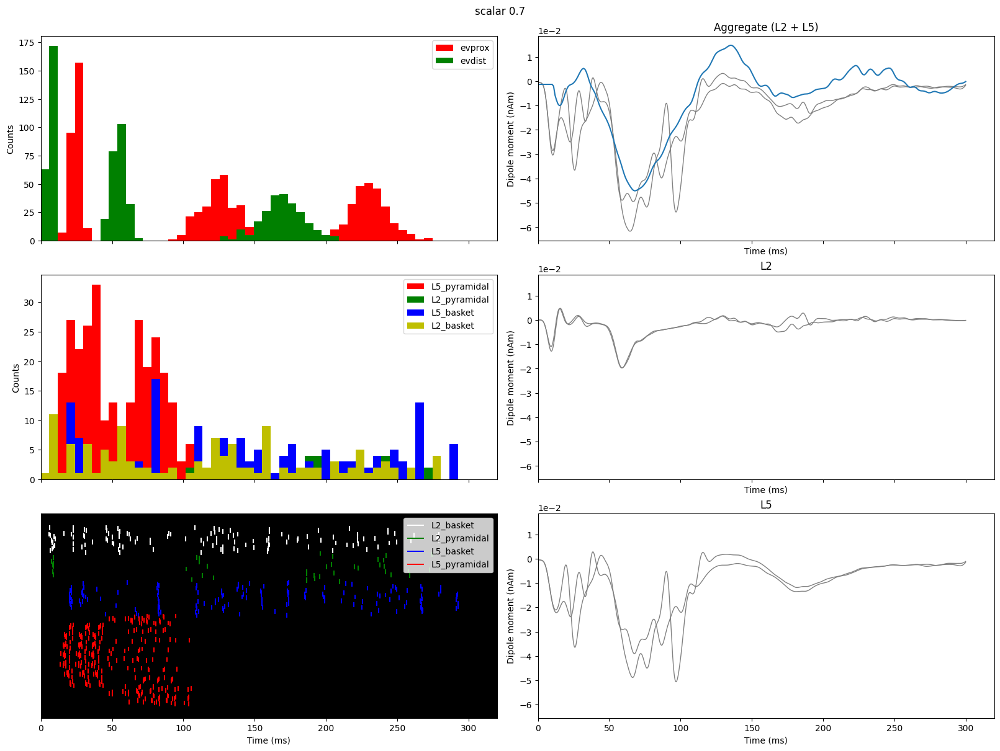

In [171]:
smoothed_sd_dist1_increase_dpl = scale_and_smooth(dist1_sd_increase_dpl,window_len=10)
make_plot(smoothed_sd_dist1_increase_dpl, dist1_sd_increase_net, dist_1_sd_scalars)

<h1> Decrease prox1 SD

In [135]:

prox_1_sd_scalars = [0.5, 0.7]

prox1_sd_params_list = [deepcopy(dist1_params_list[1]) for _ in range(len(prox_1_sd_scalars))]

for params, scalar in zip(prox1_sd_params_list, prox_1_sd_scalars):
    params['sigma_t_evprox_1'] = scalar * params['sigma_t_evprox_1']
        

print(prox1_sd_params_list[0]['sigma_t_evprox_1'])    
print(prox1_sd_params_list[1]['sigma_t_evprox_1'])

1.577431
2.2084034


In [136]:
prox1_sd_increase_dpl = []
prox1_sd_increase_net = []

for params in prox1_sd_params_list:
    dpl, net = make_net_and_simulate_jones2009(params)
    prox1_sd_increase_dpl.append(dpl)
    prox1_sd_increase_net.append(net)
smoothed_sd_prox1_increase_dpl = scale_and_smooth(prox1_sd_increase_dpl)

MPI will run 2 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Trial 1: 50.0 ms...
Trial 1: 60.0 ms...
Trial 1: 70.0 ms...
Trial 1: 80.0 ms...
Trial 1: 90.0 ms...
T

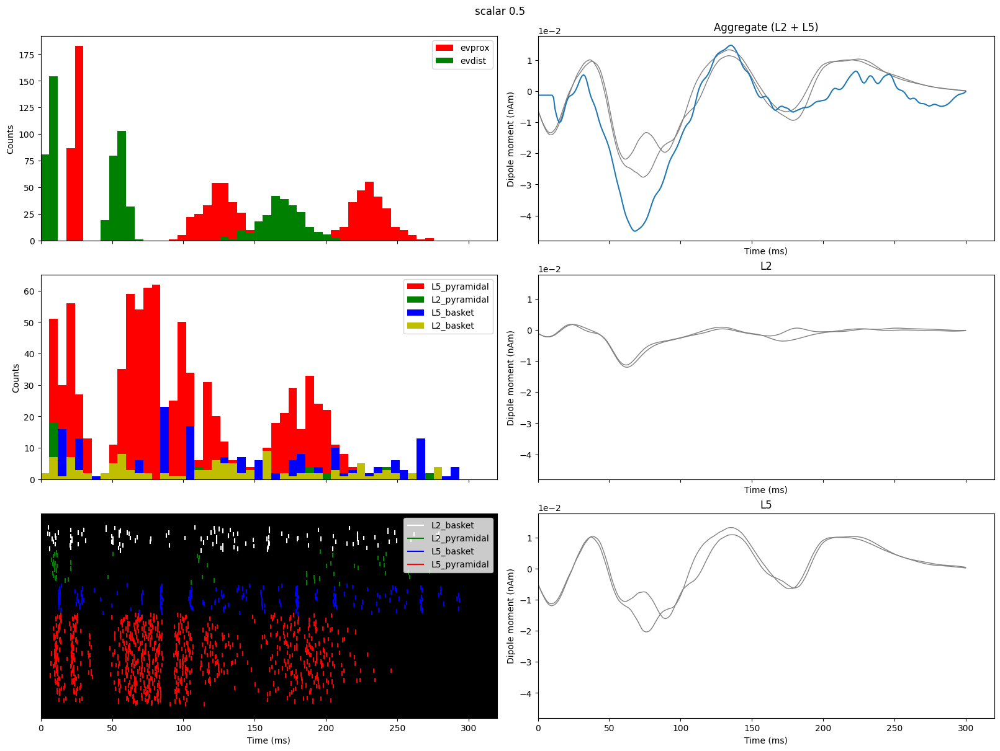

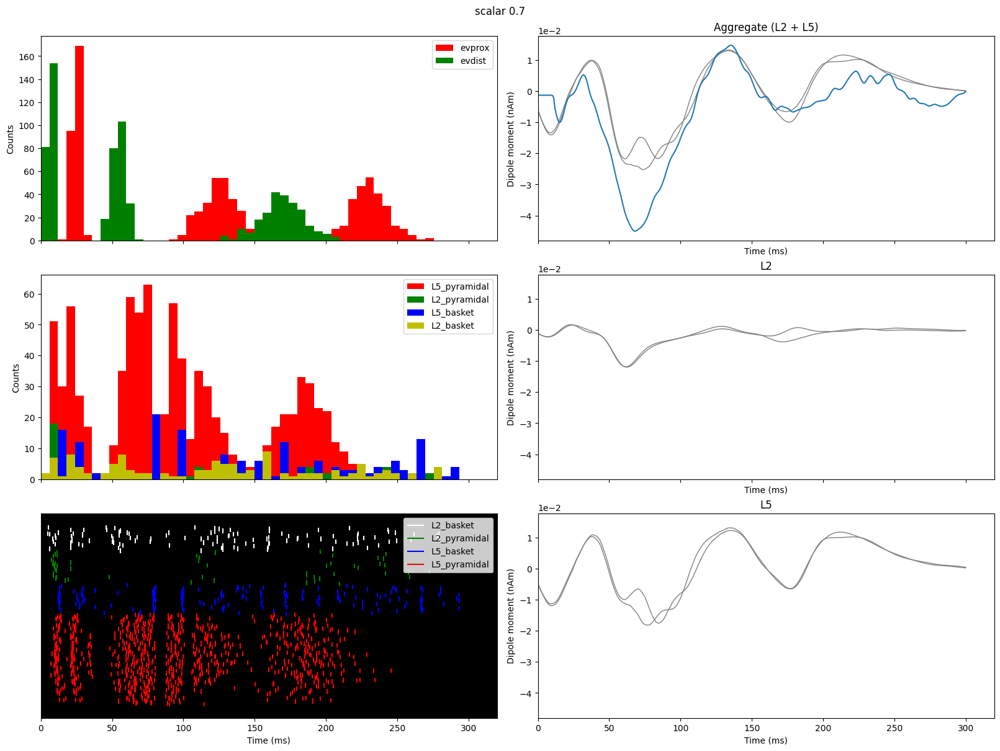

In [138]:
smoothed_sd_prox1_increase_dpl = scale_and_smooth(prox1_sd_increase_dpl,window_len=30)
make_plot(smoothed_sd_prox1_increase_dpl, prox1_sd_increase_net, prox_1_sd_scalars)

<h1>Increase prox1 drive 

In [172]:
# scale up the prox_1 drives 
prox_1_scalars = [500, 1e3]

prox1_params_list = [deepcopy(dist1_sd_params_list[1]) for _ in range(len(prox_1_scalars))]

for params, scalar in zip(prox1_params_list, prox_1_scalars):
    for param in params['gbar_evprox_1*']:
        params[param] = scalar * params[param]
        

print(prox1_params_list[0]['gbar_evprox_1*'])   

{
    "gbar_evprox_1_L2Basket_ampa": 79.694,
    "gbar_evprox_1_L2Basket_nmda": 0,
    "gbar_evprox_1_L2Pyr_ampa": 4.4465,
    "gbar_evprox_1_L2Pyr_nmda": 0,
    "gbar_evprox_1_L5Basket_ampa": 151.4885,
    "gbar_evprox_1_L5Basket_nmda": 0,
    "gbar_evprox_1_L5Pyr_ampa": 0.1825,
    "gbar_evprox_1_L5Pyr_nmda": 0
}


In [173]:
prox1_increase_dpl = []
prox1_increase_net = []

for params in prox1_params_list:
    dpl, net = make_net_and_simulate(params)
    prox1_increase_dpl.append(dpl)
    prox1_increase_net.append(net)
smoothed_prox1_increase_dpl = scale_and_smooth(prox1_increase_dpl)

MPI will run 2 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Trial 1: 50.0 ms...
Trial 1: 60.0 ms...
Trial 1: 70.0 ms...
Trial 1: 80.0 ms...
Trial 1: 90.0 ms...
T

In [183]:
smoothed_prox1_increase_dpl = scale_and_smooth(prox1_increase_dpl, window_len=30)

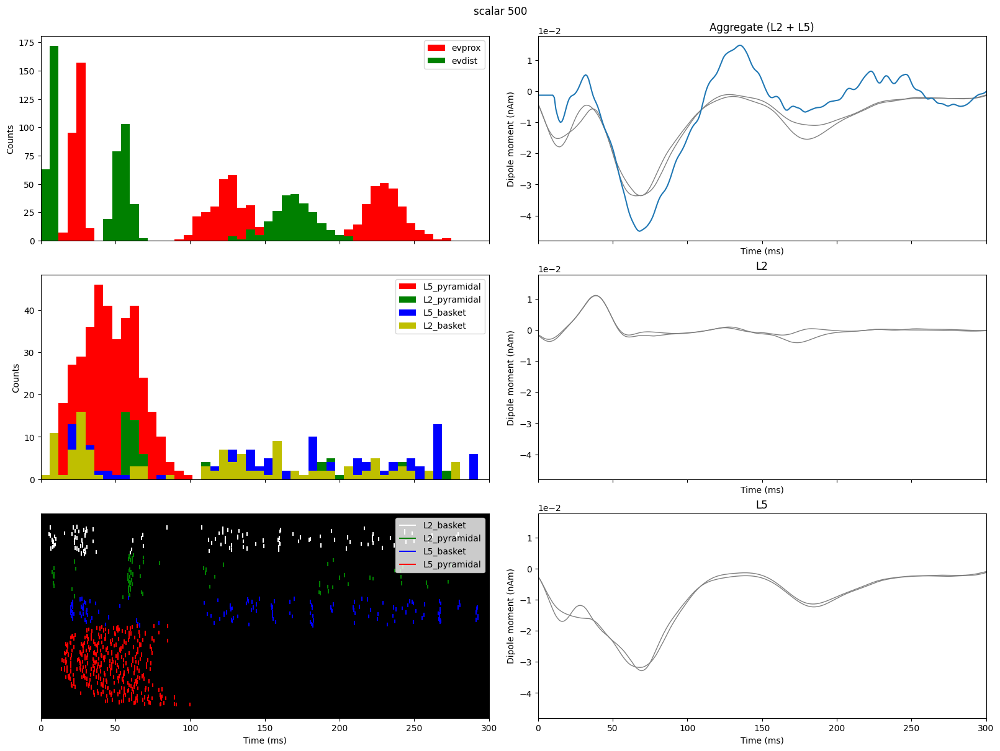

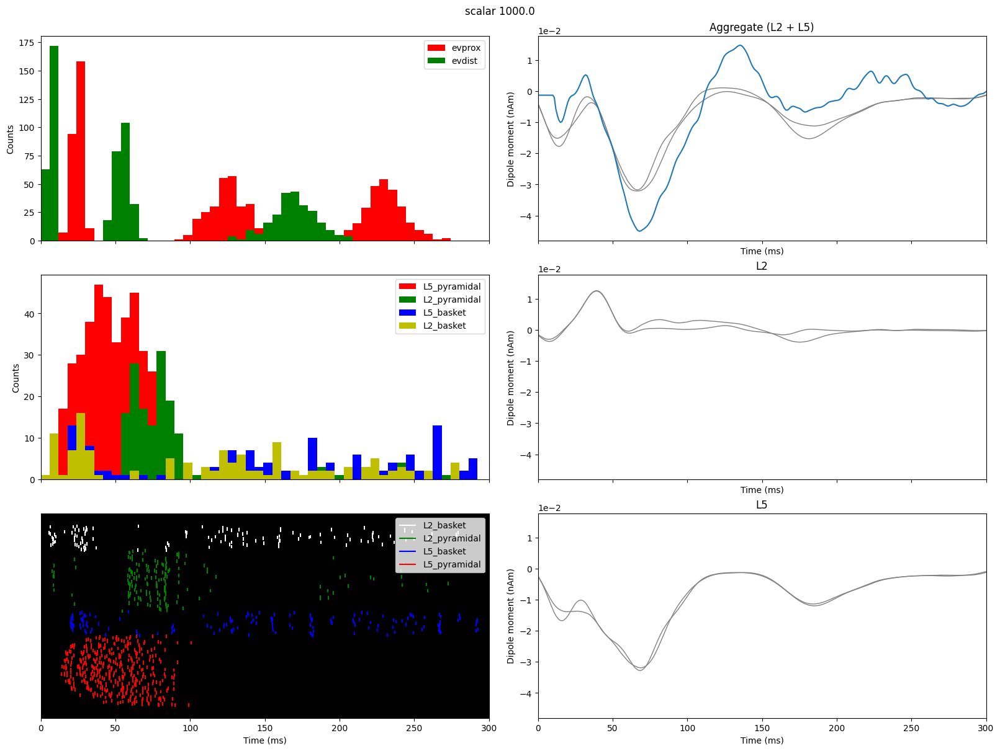

In [184]:
make_plot(smoothed_prox1_increase_dpl, prox1_increase_net, prox_1_scalars, tstop=300)

<h1> Decrease dist1 drive

In [176]:
# scale down the dist_1 drives 
dist_1_scalars = [0.6,0.8]

dist1_params_list = [deepcopy(prox1_params_list[1]) for _ in range(len(dist_1_scalars))]

for params, scalar in zip(dist1_params_list, dist_1_scalars):
    for param in params['gbar_evdist_2*']:
        params[param] = scalar * params[param]
        

print(dist1_params_list[0]['gbar_evdist_2*'])    
print(dist1_params_list[1]['gbar_evdist_2*'])

{
    "gbar_evdist_2_L2Basket_ampa": 0.0039905999999999995,
    "gbar_evdist_2_L2Basket_nmda": 0.06325019999999999,
    "gbar_evdist_2_L2Pyr_ampa": 0.005074199999999999,
    "gbar_evdist_2_L2Pyr_nmda": 0.0066834,
    "gbar_evdist_2_L5Pyr_ampa": 0.0497286,
    "gbar_evdist_2_L5Pyr_nmda": 0.009691199999999999
}
{
    "gbar_evdist_2_L2Basket_ampa": 0.0053208,
    "gbar_evdist_2_L2Basket_nmda": 0.0843336,
    "gbar_evdist_2_L2Pyr_ampa": 0.0067656,
    "gbar_evdist_2_L2Pyr_nmda": 0.0089112,
    "gbar_evdist_2_L5Pyr_ampa": 0.0663048,
    "gbar_evdist_2_L5Pyr_nmda": 0.0129216
}


In [177]:
dist1_decrease_dpl = []
dist1_decrease_net = []

for params in dist1_params_list:
    dpl, net = make_net_and_simulate(params)
    dist1_decrease_dpl.append(dpl)
    dist1_decrease_net.append(net)
smoothed_dist1_decrease_dpl = scale_and_smooth(dist1_decrease_dpl)

MPI will run 2 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Trial 1: 50.0 ms...
Trial 1: 60.0 ms...
Trial 1: 70.0 ms...
Trial 1: 80.0 ms...
Trial 1: 90.0 ms...
T

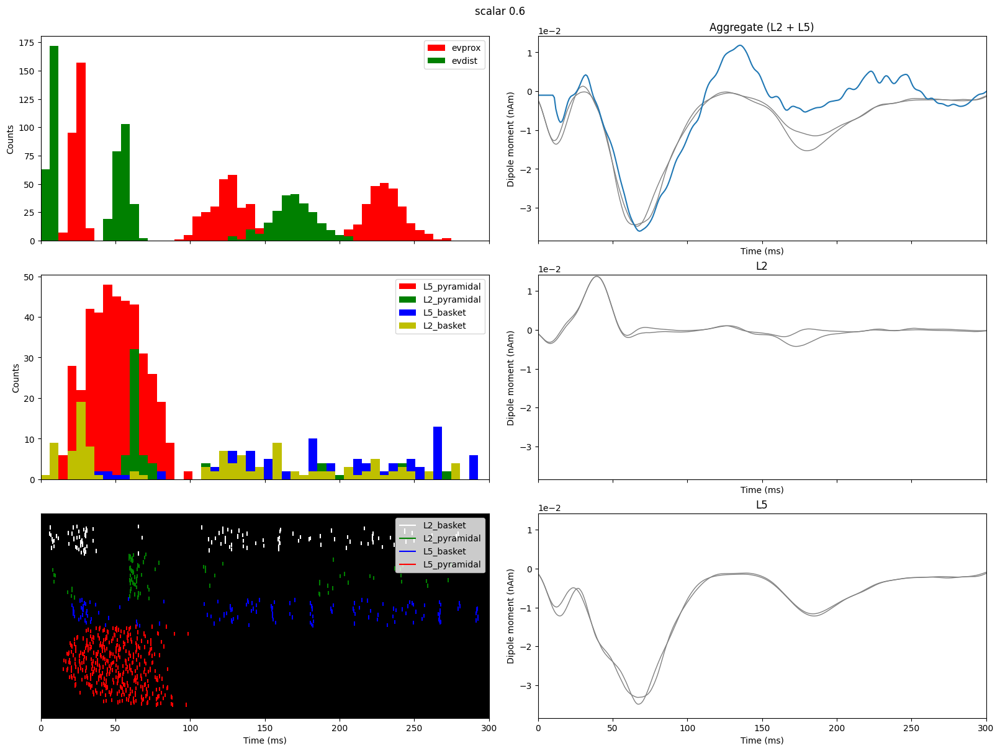

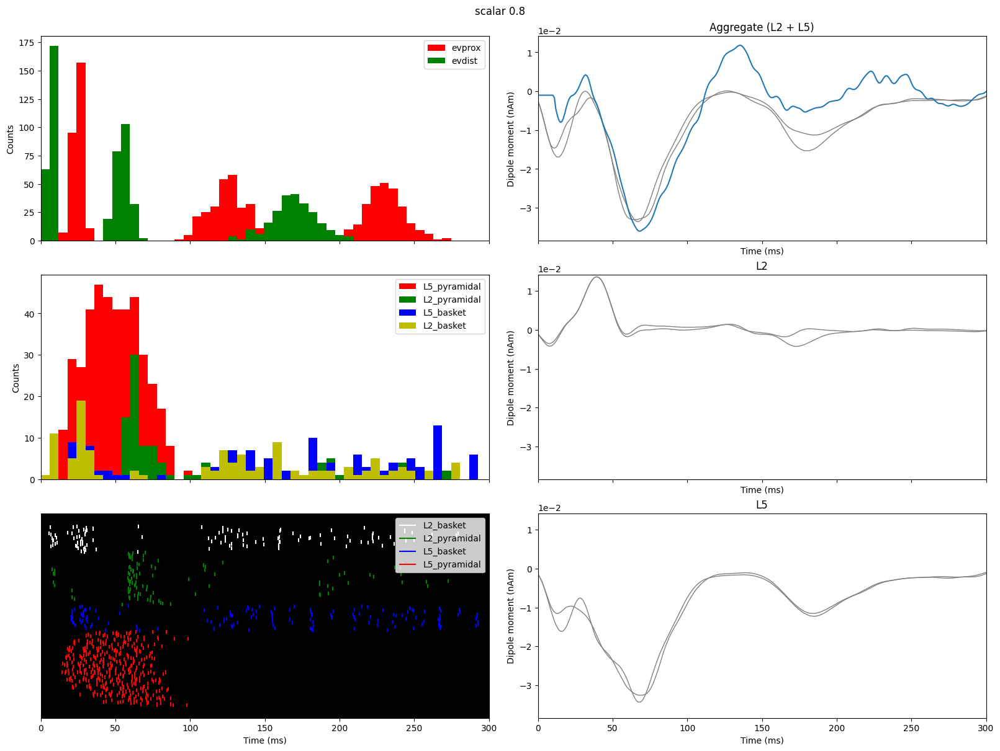

In [201]:
smoothed_dist1_decrease_dpl = scale_and_smooth(dist1_decrease_dpl,window_len=25)
make_plot(smoothed_dist1_decrease_dpl, dist1_decrease_net, dist_1_scalars, tstop=300)

<h1>Increase prox2 drive

In [205]:
# scale up the dist_2 drives 
prox_2_scalars = [1e1, 1e2, 1e3]

prox2_params_list = [deepcopy(dist1_params_list[0]) for _ in range(len(prox_2_scalars))]

for params, scalar in zip(prox2_params_list, prox_2_scalars):
    for param in params['gbar_evprox_3*']:
        params[param] = scalar * params[param]
        

print(prox2_params_list[0]['gbar_evprox_3*'])    
print(prox2_params_list[1]['gbar_evprox_3*'])

{
    "gbar_evprox_3_L2Basket_ampa": 0.8999999999999999,
    "gbar_evprox_3_L2Basket_nmda": 2.5,
    "gbar_evprox_3_L2Pyr_ampa": 0.1293,
    "gbar_evprox_3_L2Pyr_nmda": 0.0,
    "gbar_evprox_3_L5Basket_ampa": 0.14959999999999998,
    "gbar_evprox_3_L5Basket_nmda": 2.5,
    "gbar_evprox_3_L5Pyr_ampa": 0.00875,
    "gbar_evprox_3_L5Pyr_nmda": 0.0
}
{
    "gbar_evprox_3_L2Basket_ampa": 9.0,
    "gbar_evprox_3_L2Basket_nmda": 25.0,
    "gbar_evprox_3_L2Pyr_ampa": 1.2930000000000001,
    "gbar_evprox_3_L2Pyr_nmda": 0.0,
    "gbar_evprox_3_L5Basket_ampa": 1.496,
    "gbar_evprox_3_L5Basket_nmda": 25.0,
    "gbar_evprox_3_L5Pyr_ampa": 0.08750000000000001,
    "gbar_evprox_3_L5Pyr_nmda": 0.0
}


In [206]:
prox2_increase_dpl = []
prox2_increase_net = []

for params in prox2_params_list:
    dpl, net = make_net_and_simulate(params)
    prox2_increase_dpl.append(dpl)
    prox2_increase_net.append(net)
smoothed_prox2_increase_dpl = scale_and_smooth(prox2_increase_dpl)

MPI will run 2 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Trial 1: 50.0 ms...
Trial 1: 60.0 ms...
Trial 1: 70.0 ms...
Trial 1: 80.0 ms...
Trial 1: 90.0 ms...
T

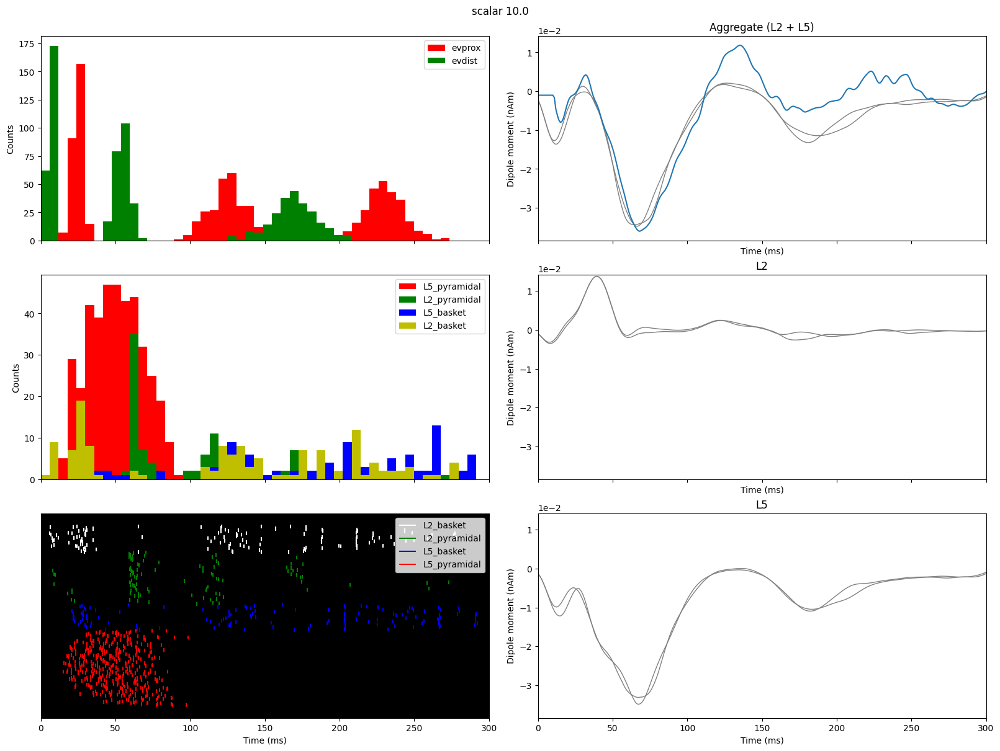

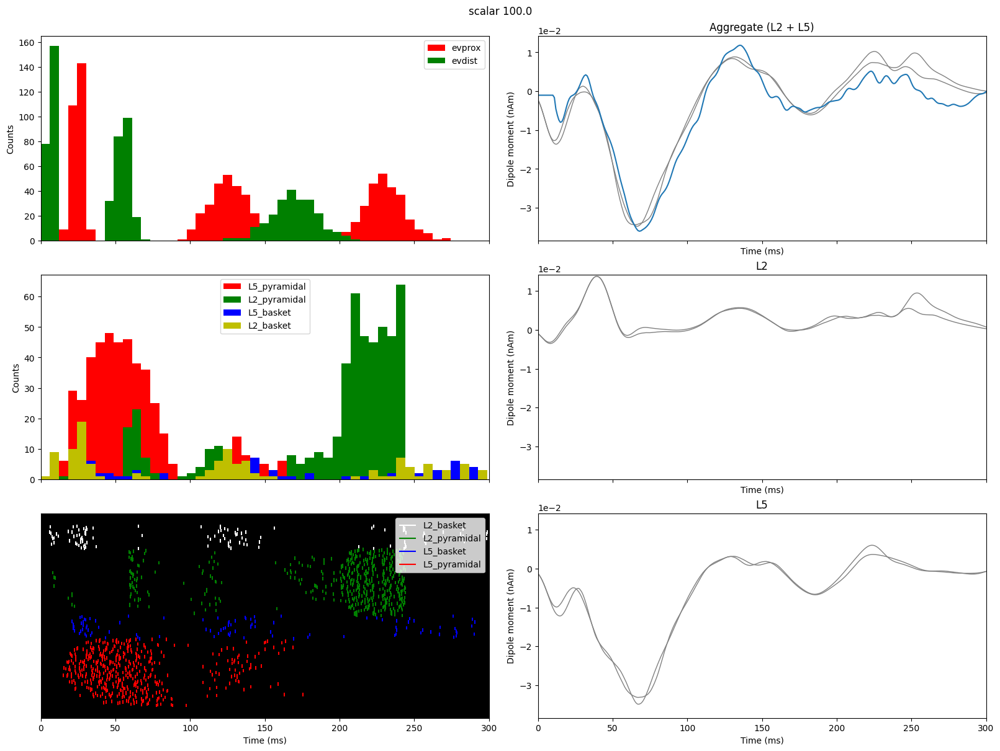

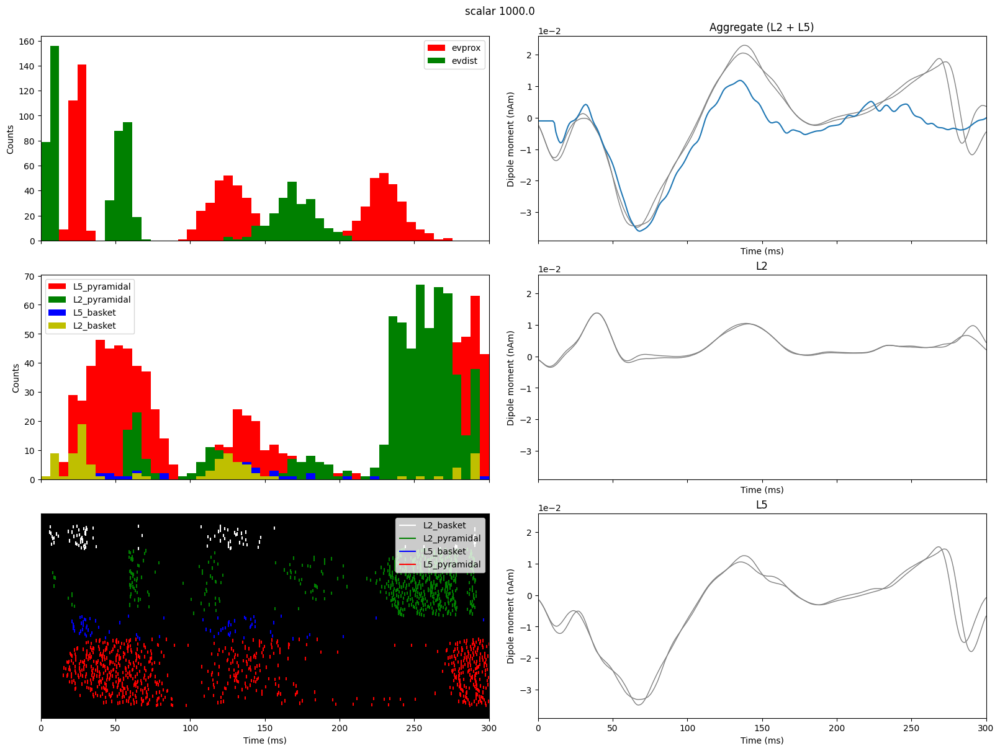

In [207]:
smoothed_prox2_increase_dpl = scale_and_smooth(prox2_increase_dpl,window_len=25)
make_plot(smoothed_prox2_increase_dpl, prox2_increase_net, prox_2_scalars, tstop=300)

<h1>Save network and such

In [208]:
with open(f'sim_data/net_TEP_calcium.pkl', 'wb') as file:
    pickle.dump(prox2_increase_net[1], file)

In [214]:
with open(f'param_files/net_TEP_calcium_params.pkl', 'wb') as file:
    pickle.dump(prox2_params_list[1], file)

<h1>Move prox1 timing earlier

In [95]:
# delay the time of prox1 inputs 
prox1_t_scalar = [4, 6]
prox1_t_params = [deepcopy(prox1_params_list[0]) for _ in range(len(prox1_t_scalar))]

for params, scalar in zip(prox1_t_params, prox1_t_scalar):
    params['t_evprox_1'] = params['t_evprox_1'] - scalar

In [97]:
prox1_t_dpl = []
prox1_t_net = []

for params in prox1_t_params:
    dpl, net = make_net_and_simulate(params)
    prox1_t_dpl.append(dpl)
    prox1_t_net.append(net)
smoothed_prox1_t_dpl = scale_and_smooth(prox1_t_dpl, window_len=20, scaling_factor=1.5)

MPI will run 2 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Trial 1: 50.0 ms...
Trial 1: 60.0 ms...
Trial 1: 70.0 ms...
Trial 1: 80.0 ms...
Trial 1: 90.0 ms...
T

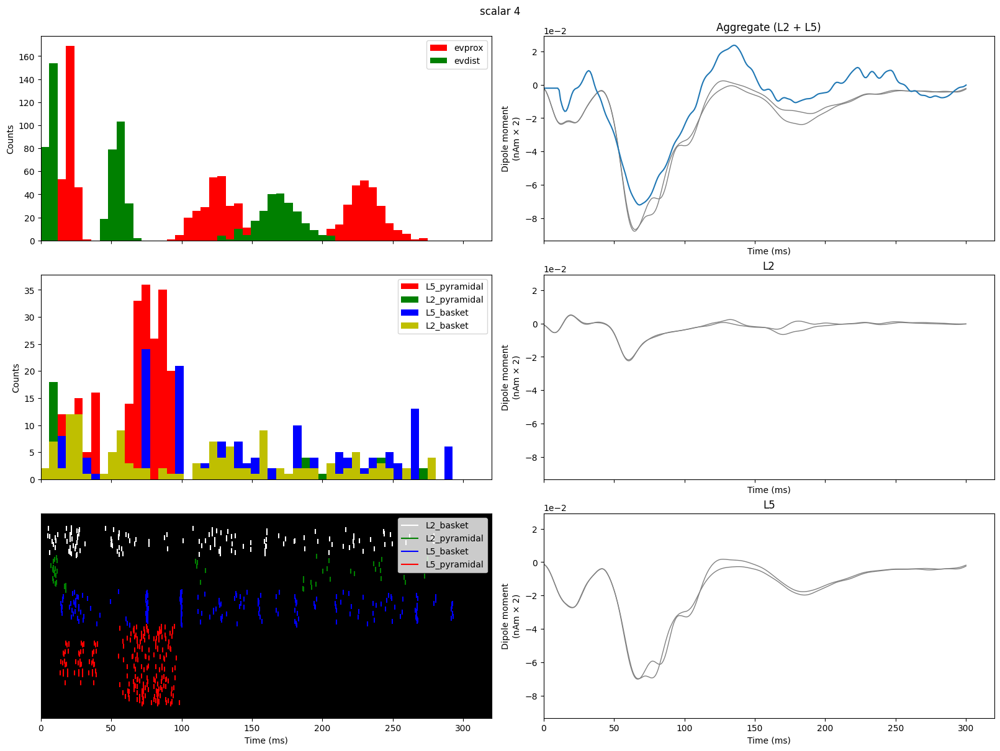

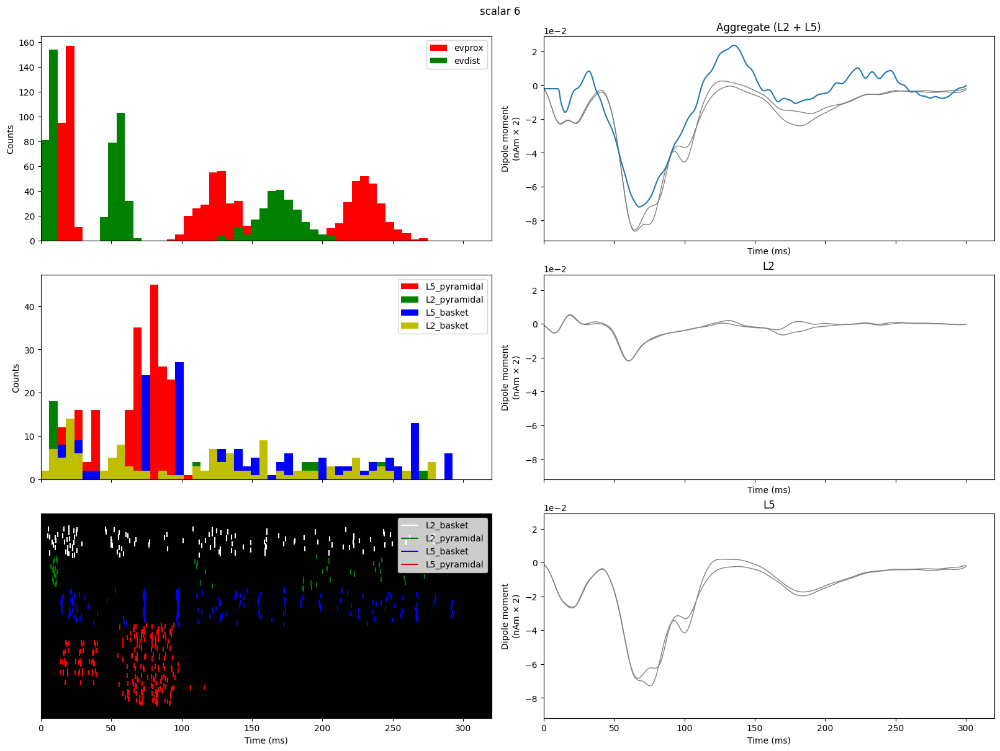

In [98]:
make_plot(smoothed_prox1_t_dpl, prox1_t_net, prox1_t_scalar)

<h1>increase prox1 drive - NMDA

In [102]:
# increase prox1 L5 pyramidal NMDA

prox1_NMDA_scalar = [0.01, 0.02]
prox1_NMDA_params = [deepcopy(prox1_t_params[1]) for _ in range(len(prox1_NMDA_scalar))]

for params, scalar in zip(prox1_NMDA_params, prox1_NMDA_scalar):
    params['gbar_evprox_1_L5Pyr_nmda'] = scalar + params['gbar_evprox_1_L5Pyr_nmda']

In [103]:
prox1_NMDA_params[1]['t_evprox_1']

28.472788

In [104]:
prox1_NMDA_dpl = []
prox1_NMDA_net = []

for params in prox1_NMDA_params:
    dpl, net = make_net_and_simulate(params)
    prox1_NMDA_dpl.append(dpl)
    prox1_NMDA_net.append(net)
smoothed_prox1_NMDA_dpl = scale_and_smooth(prox1_NMDA_dpl)

MPI will run 2 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Trial 1: 50.0 ms...
Trial 1: 60.0 ms...
Trial 1: 70.0 ms...
Trial 1: 80.0 ms...
Trial 1: 90.0 ms...
T

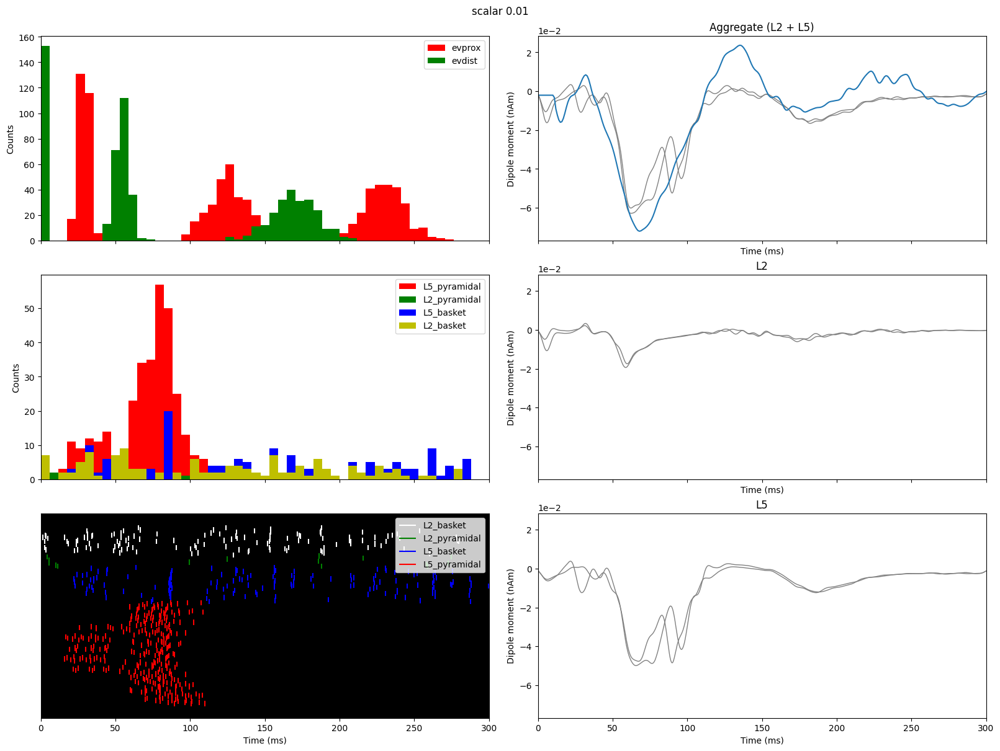

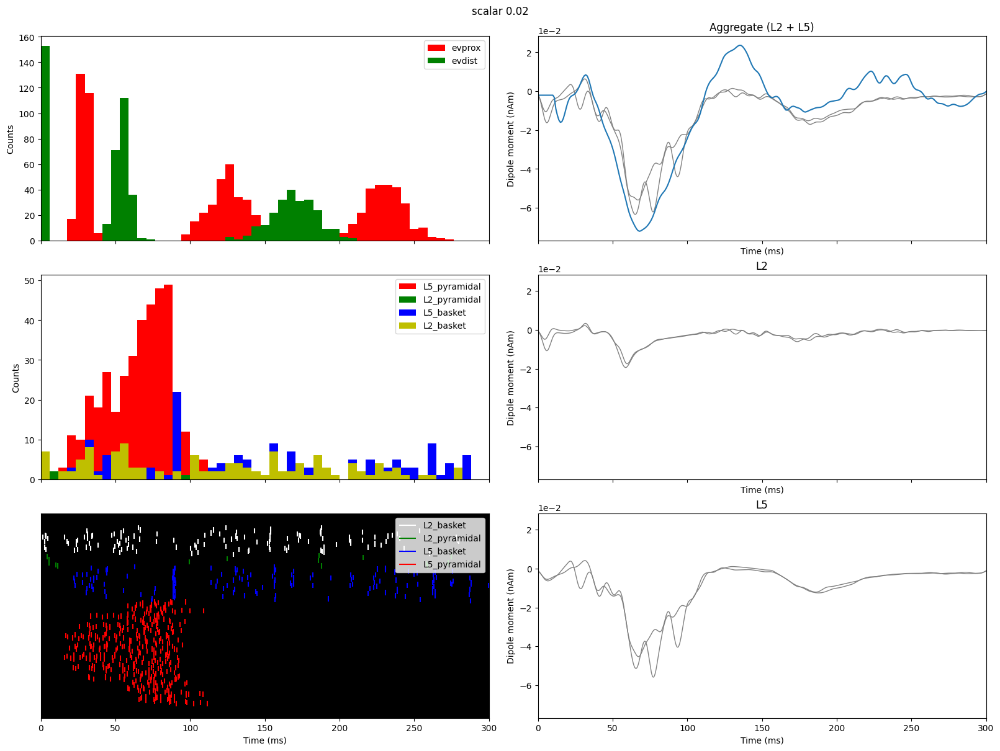

In [105]:
make_plot(smoothed_prox1_NMDA_dpl, prox1_NMDA_net, prox1_NMDA_scalar, tstop=300)

<h1>try things for dist2

MPI will run 2 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Trial 1: 50.0 ms...
Trial 1: 60.0 ms...
Trial 1: 70.0 ms...
Trial 1: 80.0 ms...
Trial 1: 90.0 ms...
T

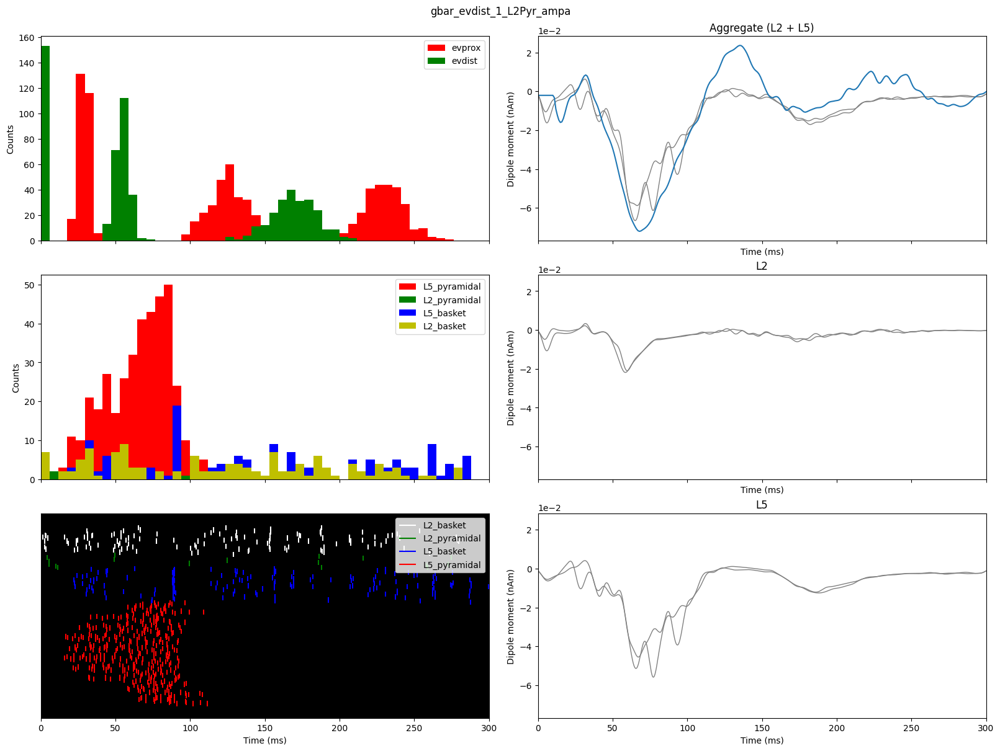

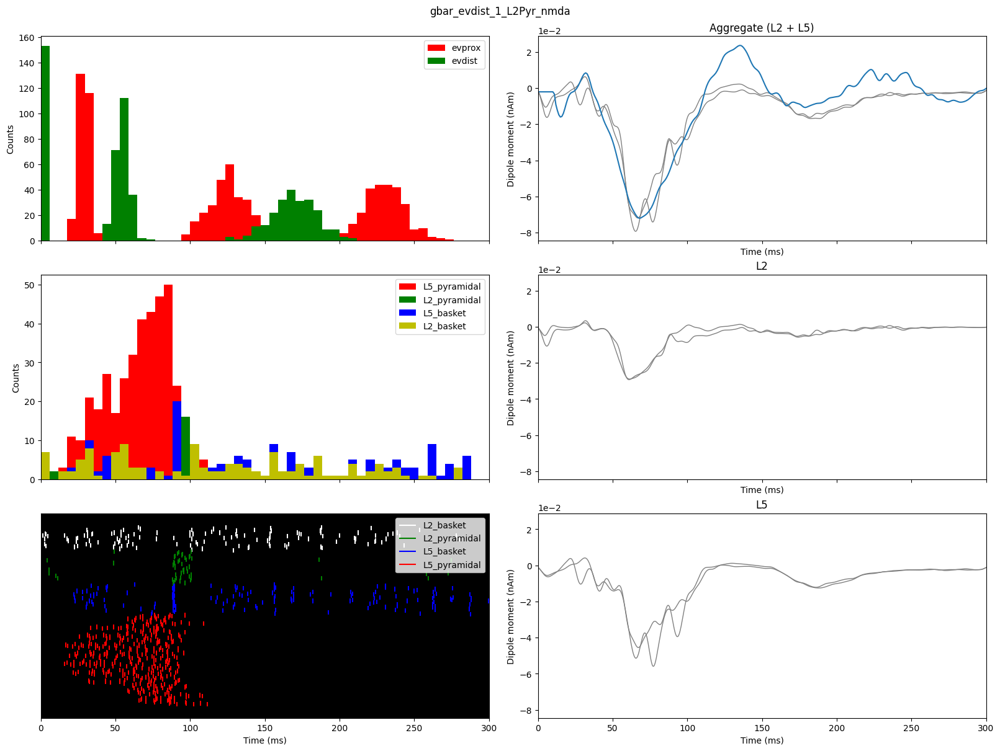

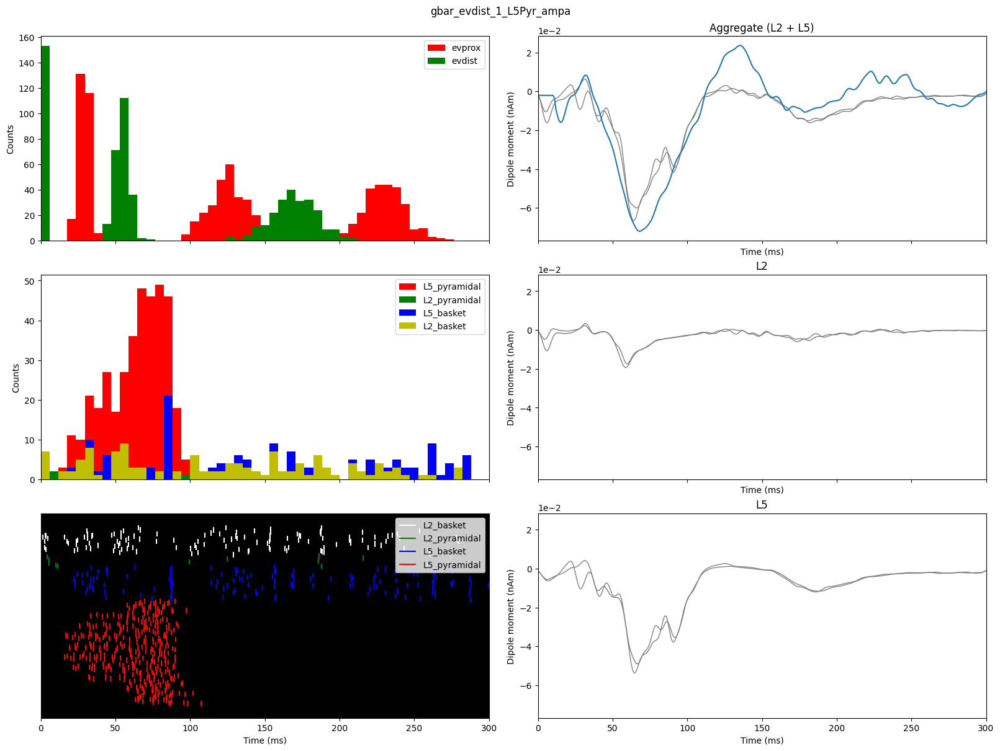

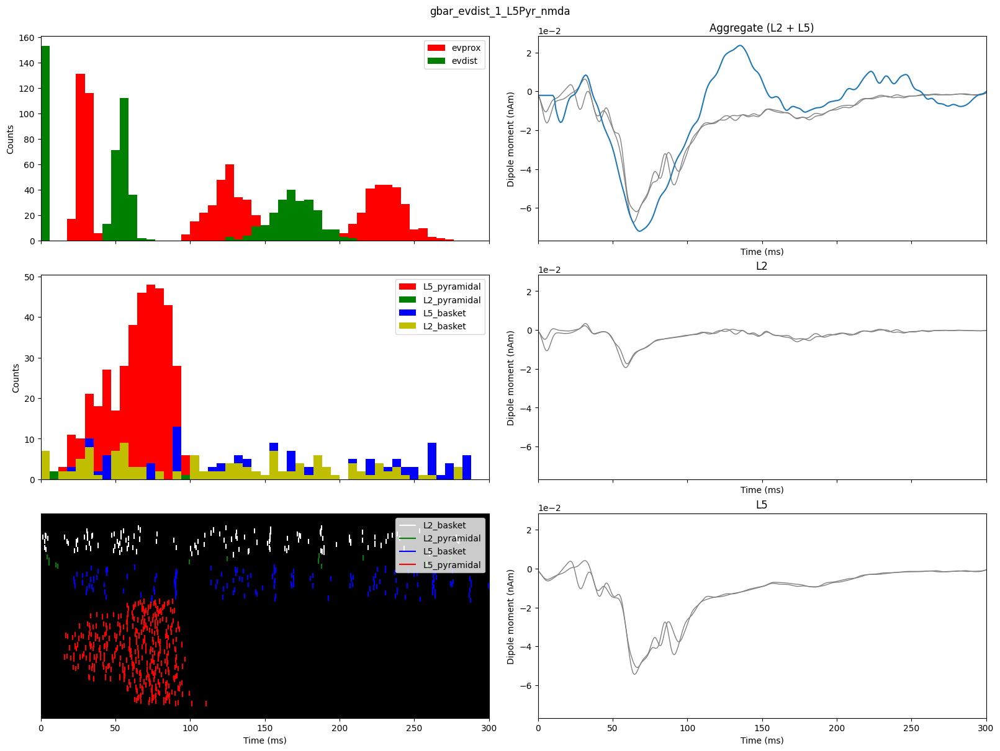

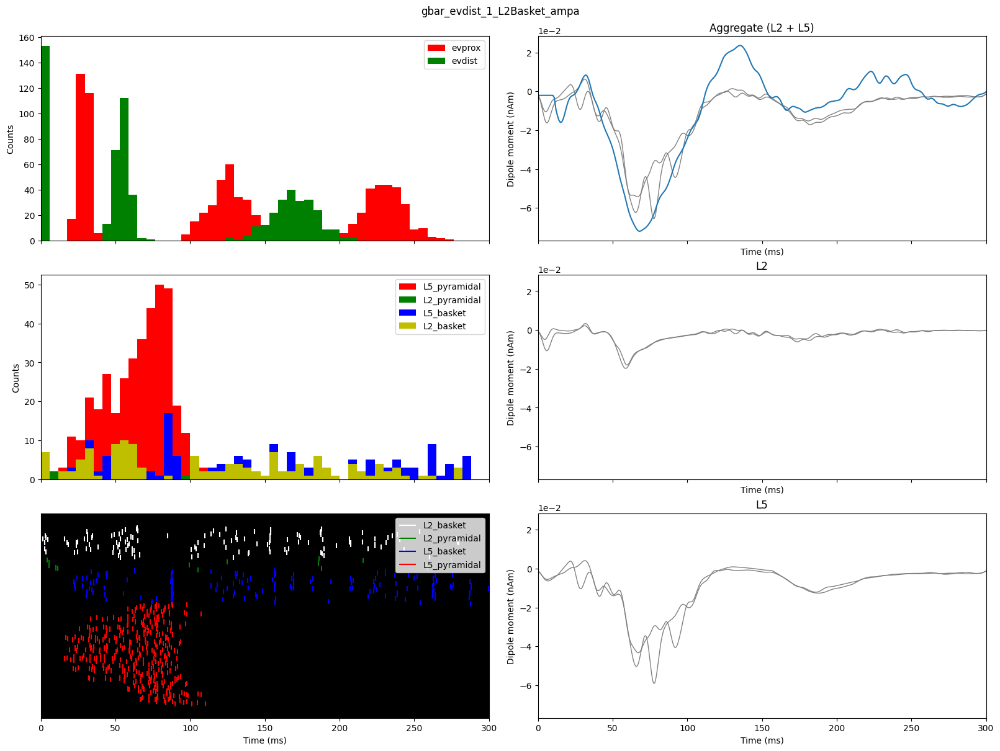

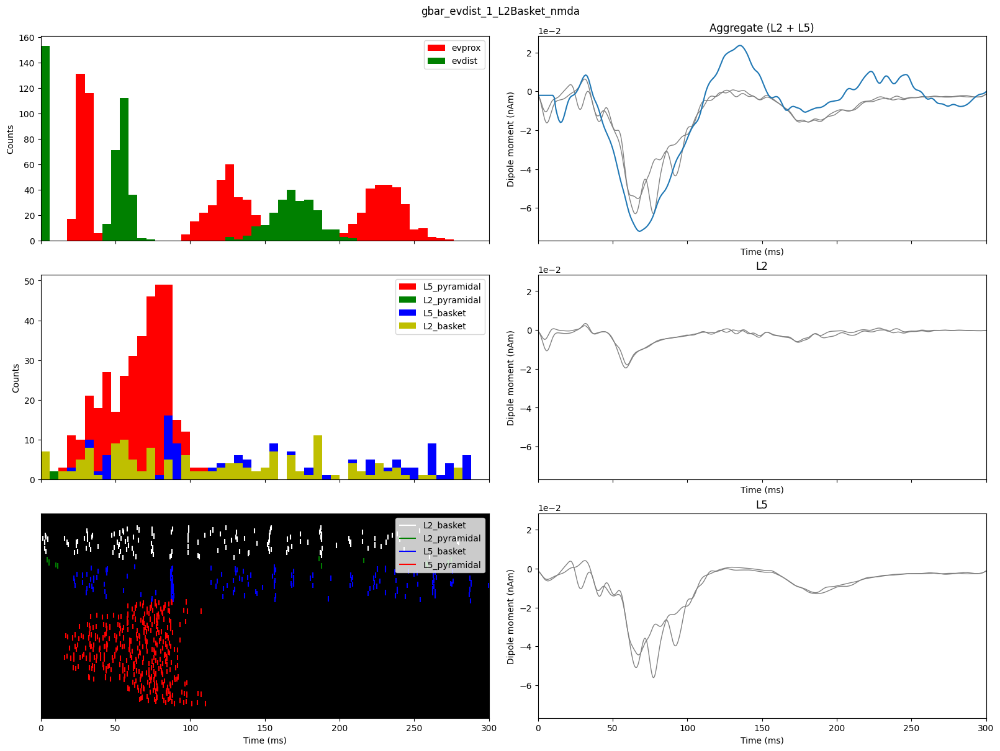

In [106]:
# "gbar_evdist_1_L2Basket_ampa": 0.279149,
#     "gbar_evdist_1_L2Basket_nmda": 0.067619,
#     "gbar_evdist_1_L2Pyr_ampa": 0.006318,
#     "gbar_evdist_1_L2Pyr_nmda": 0.030266,
#     "gbar_evdist_1_L5Pyr_ampa": 0.407355,
#     "gbar_evdist_1_L5Pyr_nmda": 1.051708,

# for list of evdist_1 params 
# change param 
# simulate and save the network and dpl
# add to list of network and dpl

scalar = 10
dist2_nets = []
dist2_dpls = []
changed_params_list = []
dist2_params = deepcopy(prox1_NMDA_params[1])


for param in dist2_params['gbar_evdist_1*']:
    params = deepcopy(dist2_params)
    params[param] = params[param] * scalar
    dpl, net = make_net_and_simulate(params)
    dist2_dpls.append(dpl)
    dist2_nets.append(net)
    changed_params_list.append(param)
dist2_smoothed_dpls = scale_and_smooth(dist2_dpls)

# plot the list of dpls and title them by the list of changed param names 
make_plot(dist2_smoothed_dpls, dist2_nets, [scalar], tstop=300, title_list=changed_params_list)



MPI will run 2 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Trial 1: 50.0 ms...
Trial 1: 60.0 ms...
Trial 1: 70.0 ms...
Trial 1: 80.0 ms...
Trial 1: 90.0 ms...
T

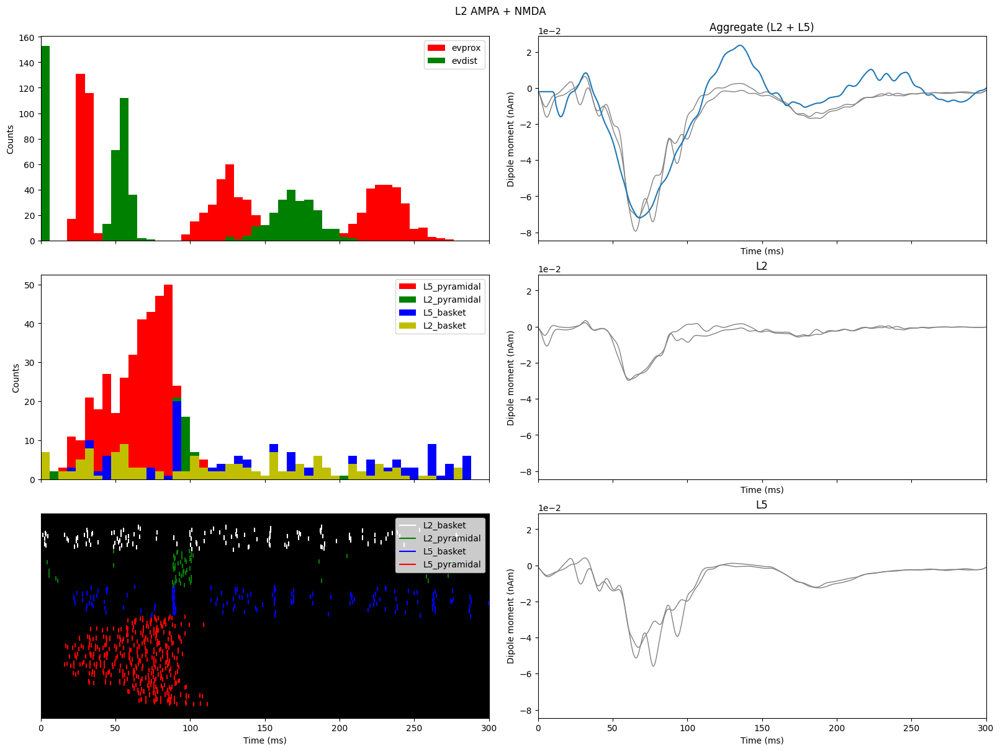

In [107]:
dist2_params['gbar_evdist_1_L2Pyr_ampa'] = dist2_params['gbar_evdist_1_L2Pyr_ampa']*10
dist2_params['gbar_evdist_1_L2Pyr_nmda'] = dist2_params['gbar_evdist_1_L2Pyr_nmda']*10

dpl, net = make_net_and_simulate(dist2_params)
dist2_smoothed_dpl = scale_and_smooth([dpl])
make_plot(dist2_smoothed_dpl, [net], [scalar], tstop=300, title_list=['L2 AMPA + NMDA'])


<h1> Trying things for prox2

MPI will run 2 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Trial 1: 50.0 ms...
Trial 1: 60.0 ms...
Trial 1: 70.0 ms...
Trial 1: 80.0 ms...
Trial 1: 90.0 ms...
T

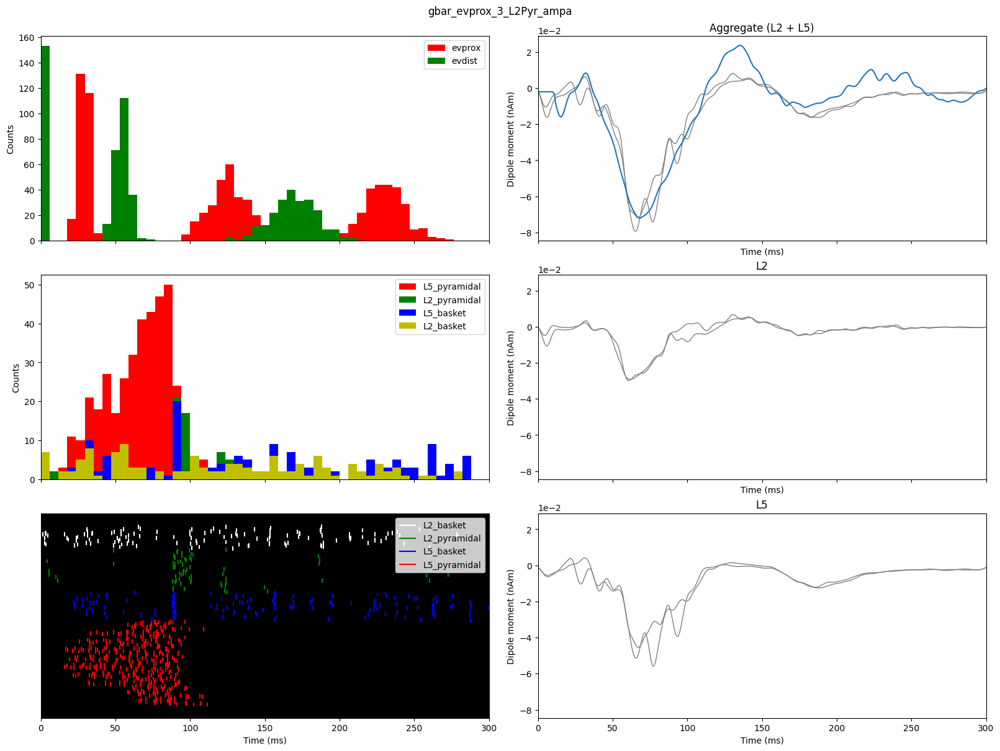

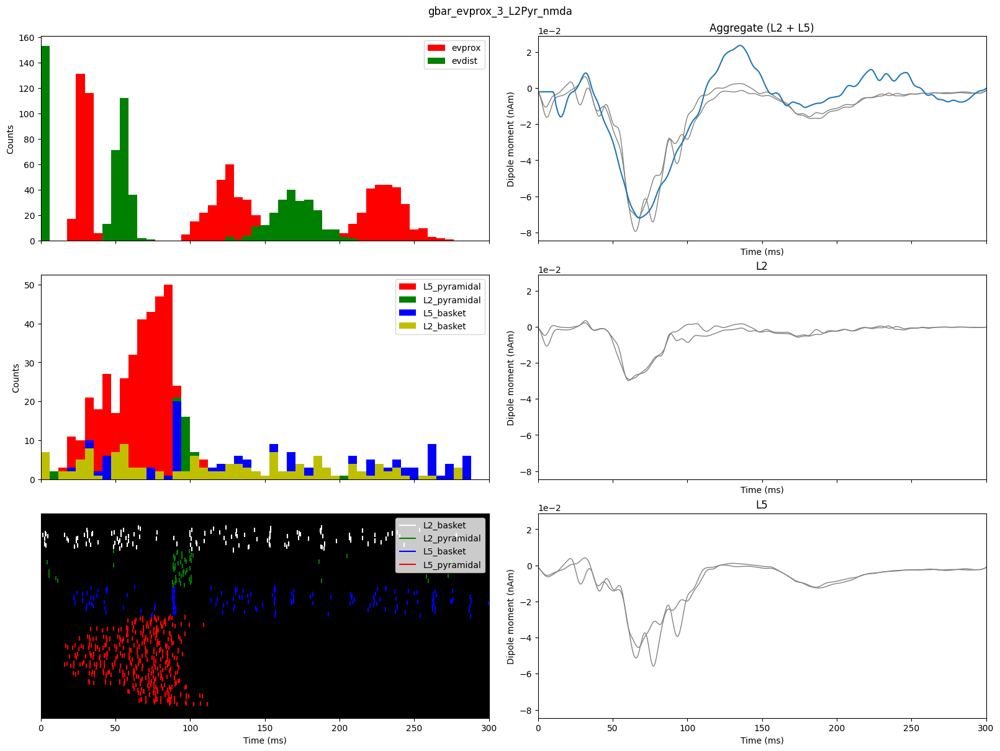

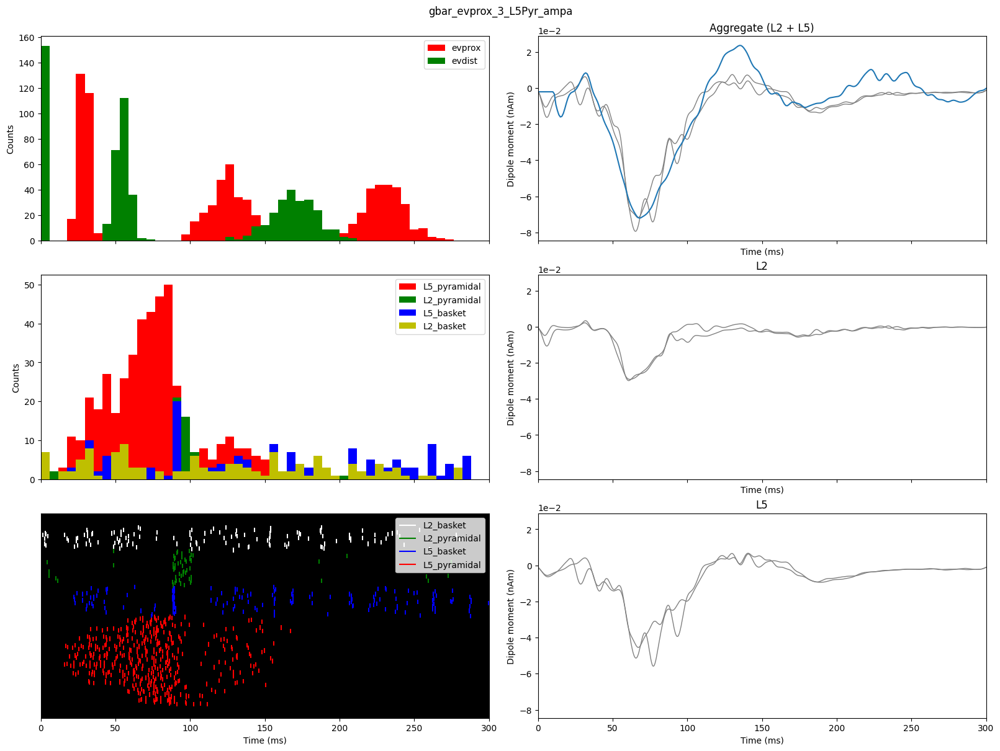

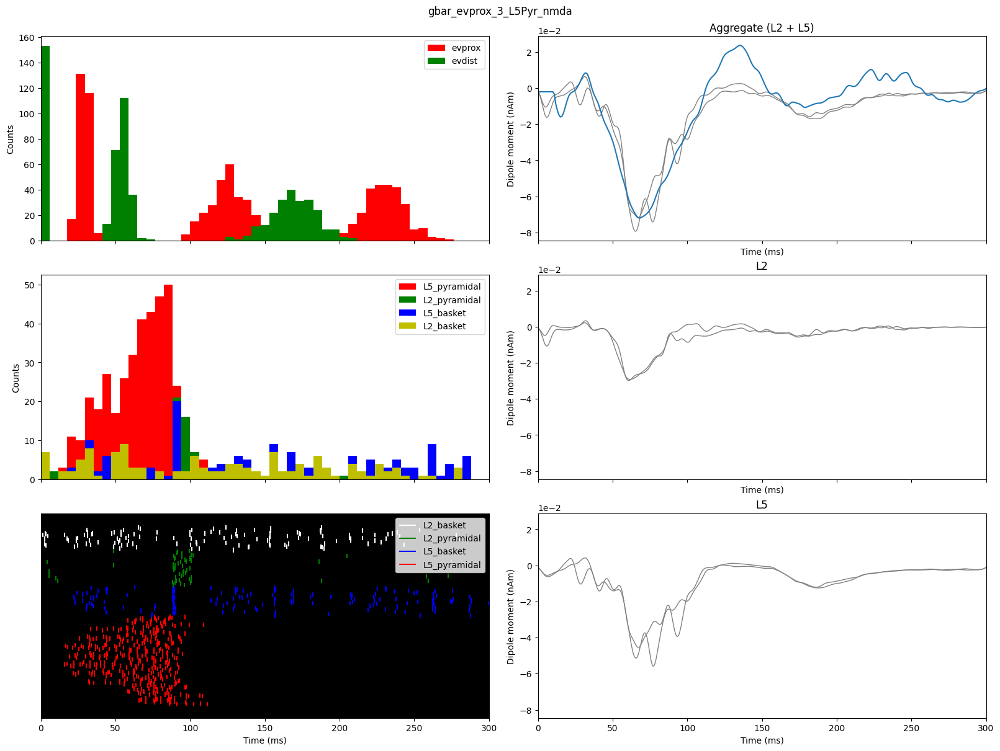

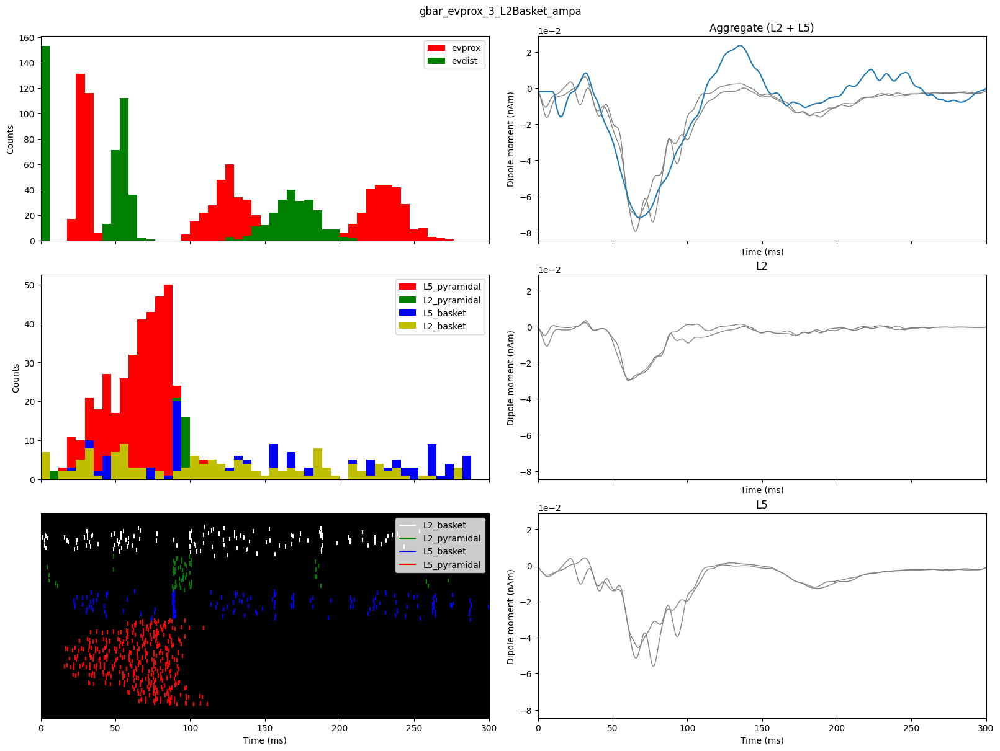

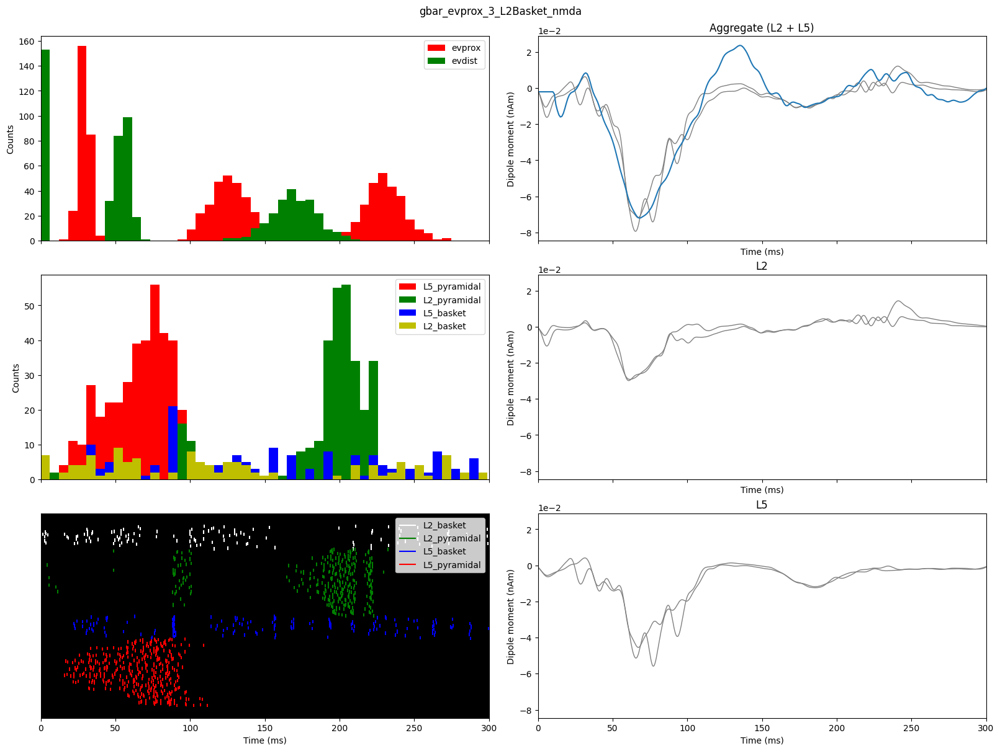

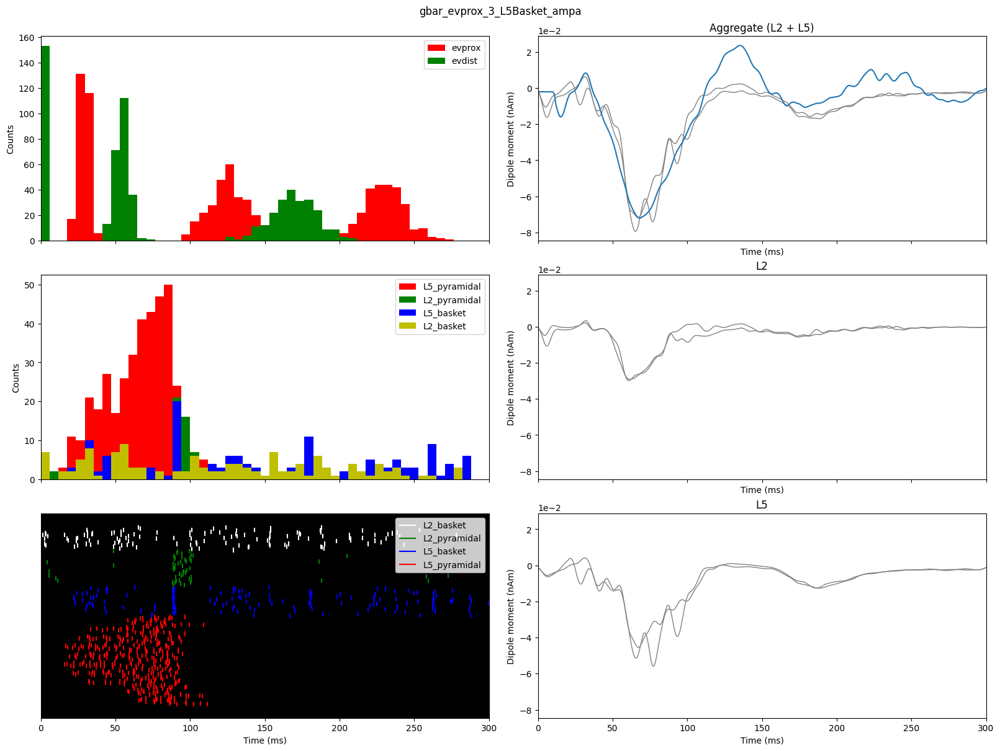

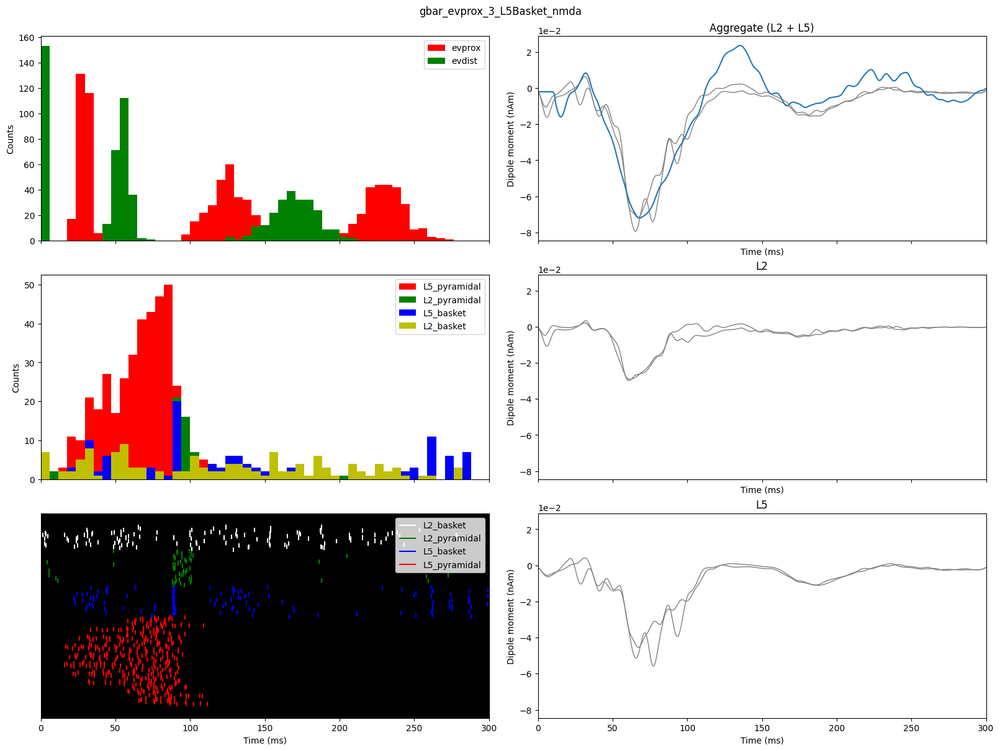

In [109]:

scalar = 100
prox2_nets = []
prox2_dpls = []
changed_params_list_prox2 = []
prox2_params = deepcopy(dist2_params)


for param in dist2_params['gbar_evprox_3*']:
    params = deepcopy(dist2_params)
    params[param] = params[param] * scalar
    dpl, net = make_net_and_simulate(params)
    prox2_dpls.append(dpl)
    prox2_nets.append(net)
    changed_params_list_prox2.append(param)
prox2_smoothed_dpls = scale_and_smooth(prox2_dpls)

# plot the list of dpls and title them by the list of changed param names 
make_plot(prox2_smoothed_dpls, prox2_nets, [scalar], tstop=300, title_list=changed_params_list_prox2)

<h1>Adjust dist1</h1>

In [27]:
# increase the sd of dist1 inputs 

dist1_sd_scalar = [2, 3, 4, 5]
dist1_sd_params = [deepcopy(original_params) for _ in range(len(dist1_sd_scalar))]

for params, scalar in zip(dist1_sd_params, dist1_sd_scalar):
    params['sigma_t_evdist_2'] = scalar * params['sigma_t_evdist_2']

In [28]:
dist1_sd_dpl = []
dist1_sd_net = []

for params in dist1_sd_params:
    dpl, net = make_net_and_simulate(params)
    dist1_sd_dpl.append(dpl)
    dist1_sd_net.append(net)
smoothed_dist1_sd_dpl = scale_and_smooth(dist1_sd_dpl)

MPI will run 2 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Trial 1: 50.0 ms...
Trial 1: 60.0 ms...
Trial 1: 70.0 ms...
Trial 1: 80.0 ms...
Trial 1: 90.0 ms...
T

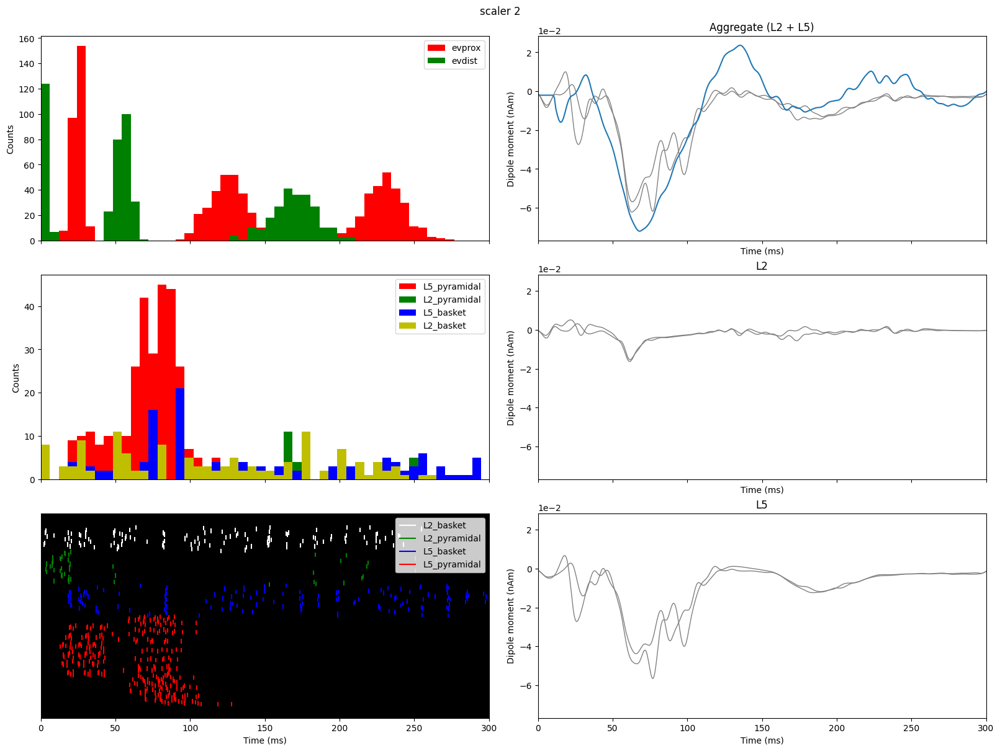

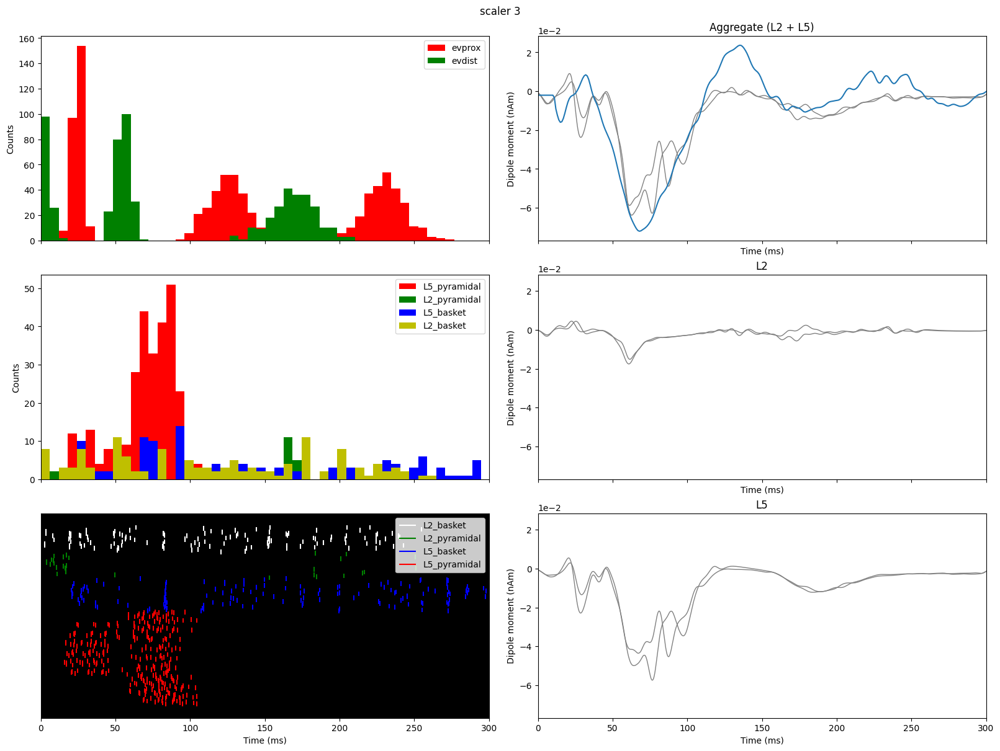

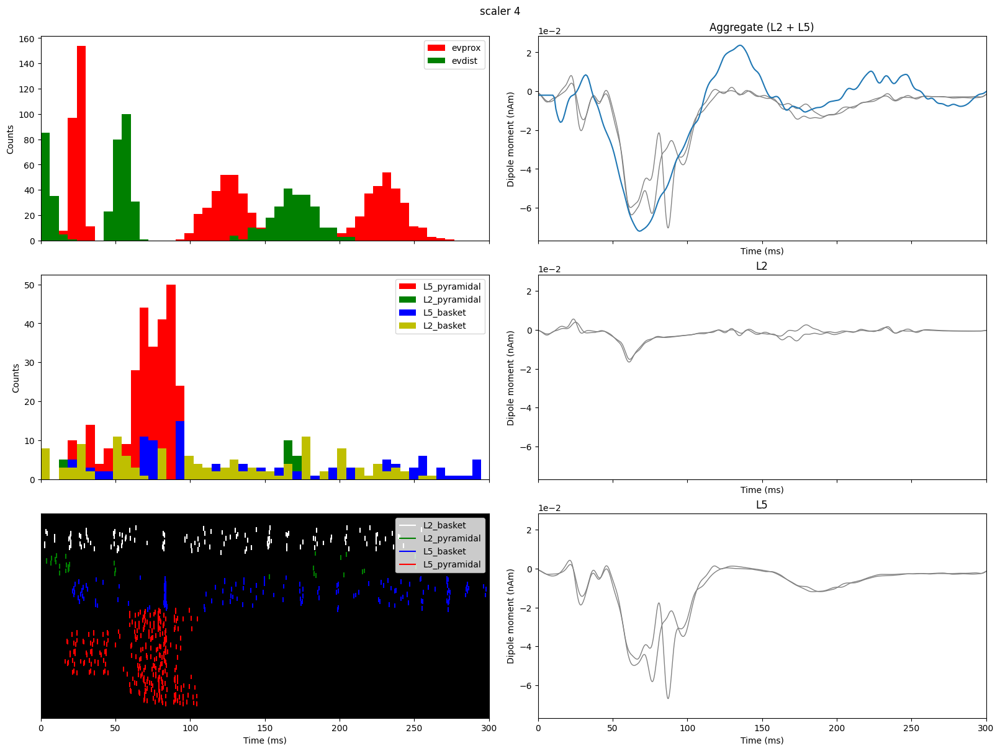

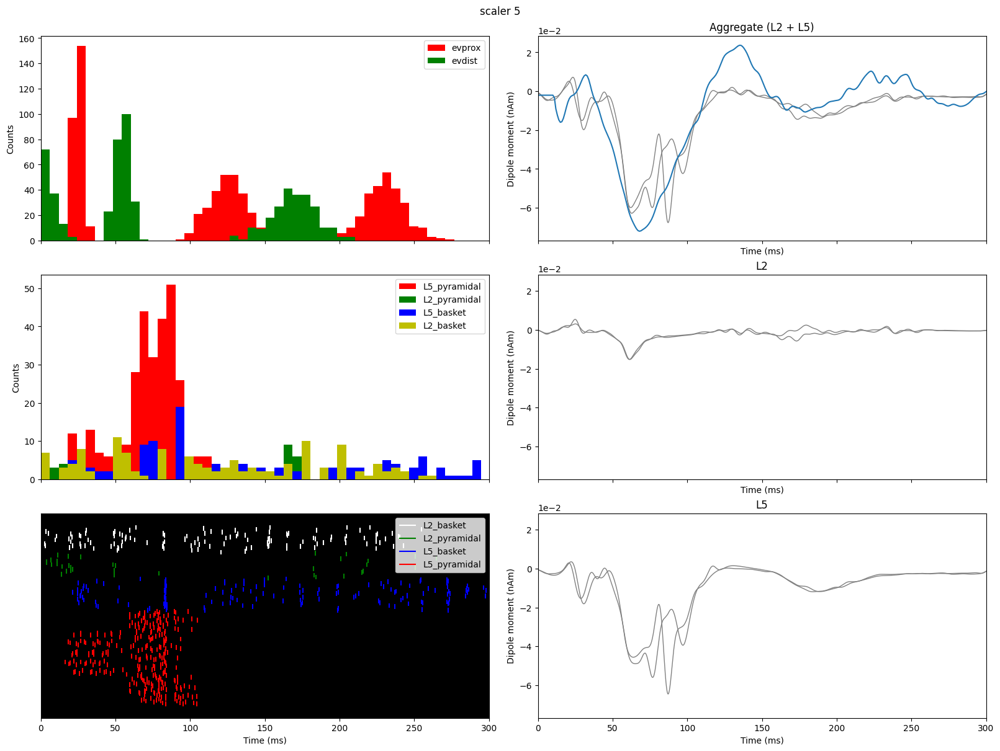

In [29]:
make_plot(smoothed_dist1_sd_dpl, dist1_sd_net, dist1_sd_scalar, tstop=300)

<h1>Just dist1

In [149]:
just_dist1_params = deepcopy(original_params)

params_to_clear = [just_dist1_params['gbar_evdist_1_*'], 
                    just_dist1_params['gbar_evdist_3_*'],
                    just_dist1_params['gbar_evprox_1_*'],
                    just_dist1_params['gbar_evprox_2_*'],
                    just_dist1_params['gbar_evprox_3_*'],]
params_to_clear = [element for nested_list in params_to_clear for element in nested_list]

for param in params_to_clear:
    just_dist1_params[param] = 0

print(just_dist1_params)


{
    "L2Basket_Gauss_A_weight": 0.0,
    "L2Basket_Gauss_mu": 2000.0,
    "L2Basket_Gauss_sigma": 3.6,
    "L2Basket_Pois_A_weight_ampa": 0.0,
    "L2Basket_Pois_A_weight_nmda": 0.0,
    "L2Basket_Pois_lamtha": 0.0,
    "L2Pyr_Gauss_A_weight": 0.0,
    "L2Pyr_Gauss_mu": 2000.0,
    "L2Pyr_Gauss_sigma": 3.6,
    "L2Pyr_Pois_A_weight_ampa": 0.0,
    "L2Pyr_Pois_A_weight_nmda": 0.0,
    "L2Pyr_Pois_lamtha": 0.0,
    "L2Pyr_ampa_e": 0.0,
    "L2Pyr_ampa_tau1": 0.5,
    "L2Pyr_ampa_tau2": 5.0,
    "L2Pyr_apical1_L": 306.0,
    "L2Pyr_apical1_diam": 4.08,
    "L2Pyr_apicaloblique_L": 340.0,
    "L2Pyr_apicaloblique_diam": 3.91,
    "L2Pyr_apicaltrunk_L": 59.5,
    "L2Pyr_apicaltrunk_diam": 4.25,
    "L2Pyr_apicaltuft_L": 238.0,
    "L2Pyr_apicaltuft_diam": 3.4,
    "L2Pyr_basal1_L": 85.0,
    "L2Pyr_basal1_diam": 4.25,
    "L2Pyr_basal2_L": 255.0,
    "L2Pyr_basal2_diam": 2.72,
    "L2Pyr_basal3_L": 255.0,
    "L2Pyr_basal3_diam": 2.72,
    "L2Pyr_dend_Ra": 200.0,
    "L2Pyr_dend_cm": 0.619

In [150]:
just_dist1_dpl, just_dist1_net = make_net_and_simulate_jones2009(just_dist1_params, n_trials = 4)
smoothed_just_dist1_dpl = scale_and_smooth([just_dist1_dpl])


MPI will run 4 trial(s) sequentially by distributing network neurons over 4 processes.
numprocs=4
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/h

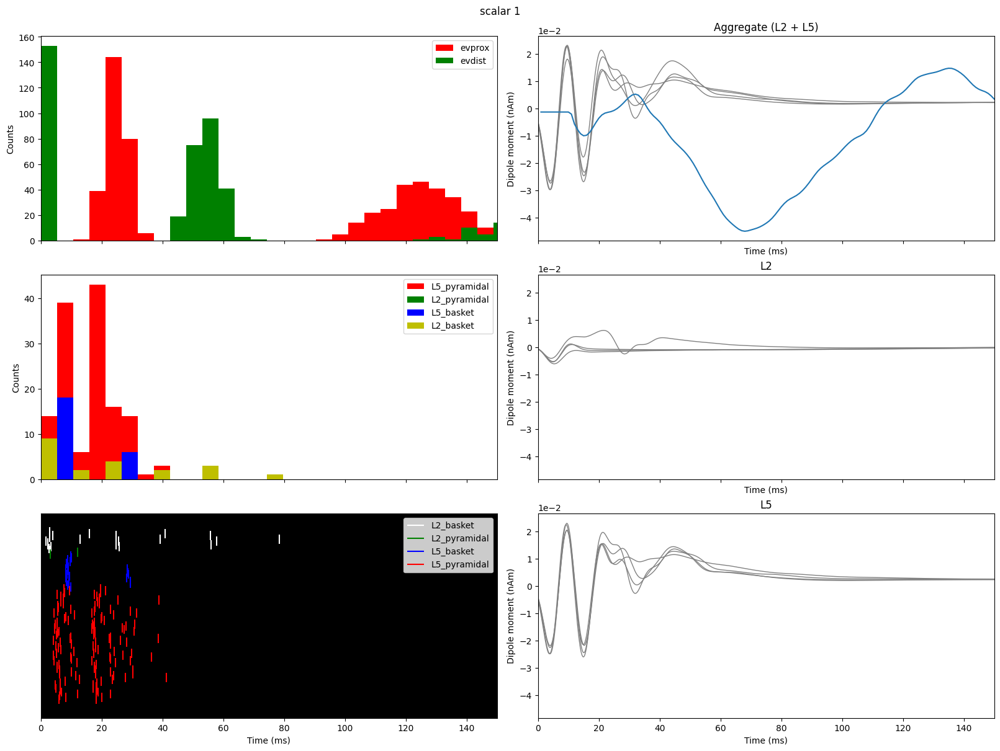

In [151]:
make_plot(smoothed_just_dist1_dpl, [just_dist1_net], [1], tstop=150)

<h1> adjust the SD of just dist1

In [24]:
dist1_sd_scalar = [2, 3, 4, 5]
dist1_sd_params = [deepcopy(just_dist1_params) for _ in range(len(dist1_sd_scalar))]

for params, scalar in zip(dist1_sd_params, dist1_sd_scalar):
    params['sigma_t_evdist_2'] = scalar * params['sigma_t_evdist_2']

In [25]:
dist1_sd_dpl = []
dist1_sd_net = []

for params in dist1_sd_params:
    dpl, net = make_net_and_simulate(params,tstop=150)
    dist1_sd_dpl.append(dpl)
    dist1_sd_net.append(net)
smoothed_dist1_sd_dpl = scale_and_smooth(dist1_sd_dpl)

MPI will run 2 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Trial 1: 50.0 ms...
Trial 1: 60.0 ms...
Trial 1: 70.0 ms...
Trial 1: 80.0 ms...
Trial 1: 90.0 ms...
T

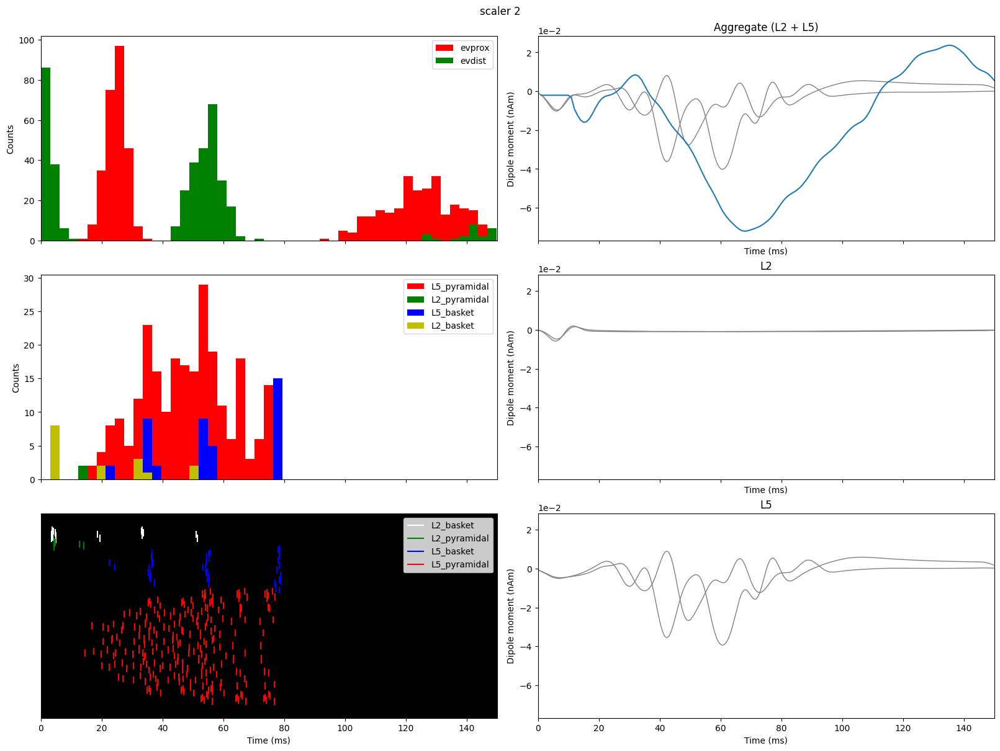

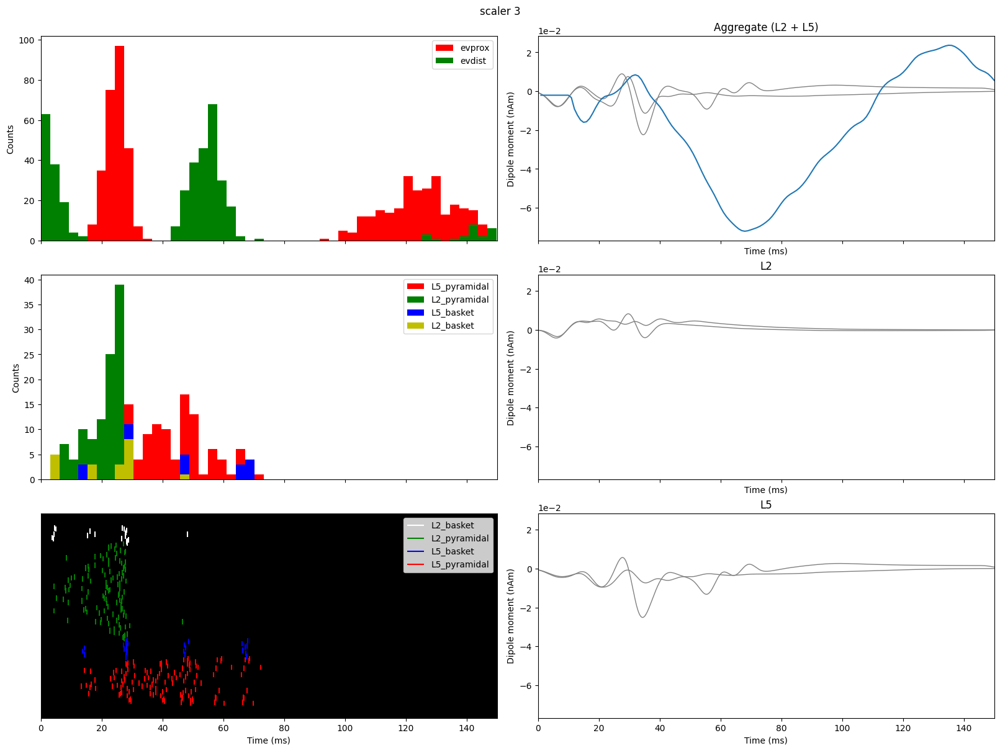

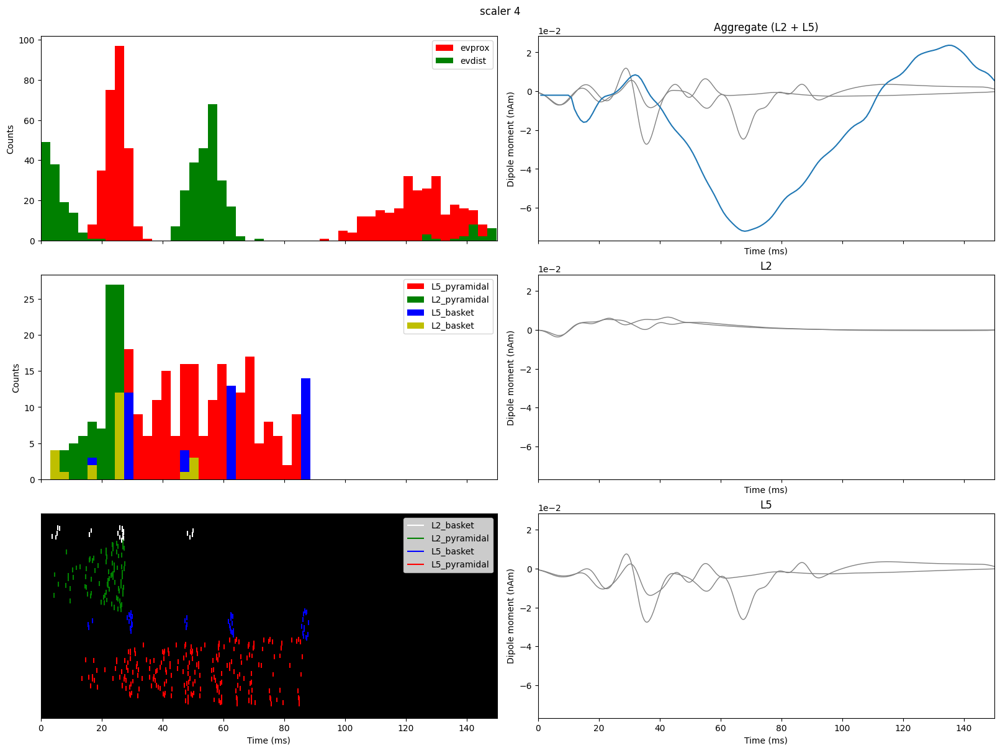

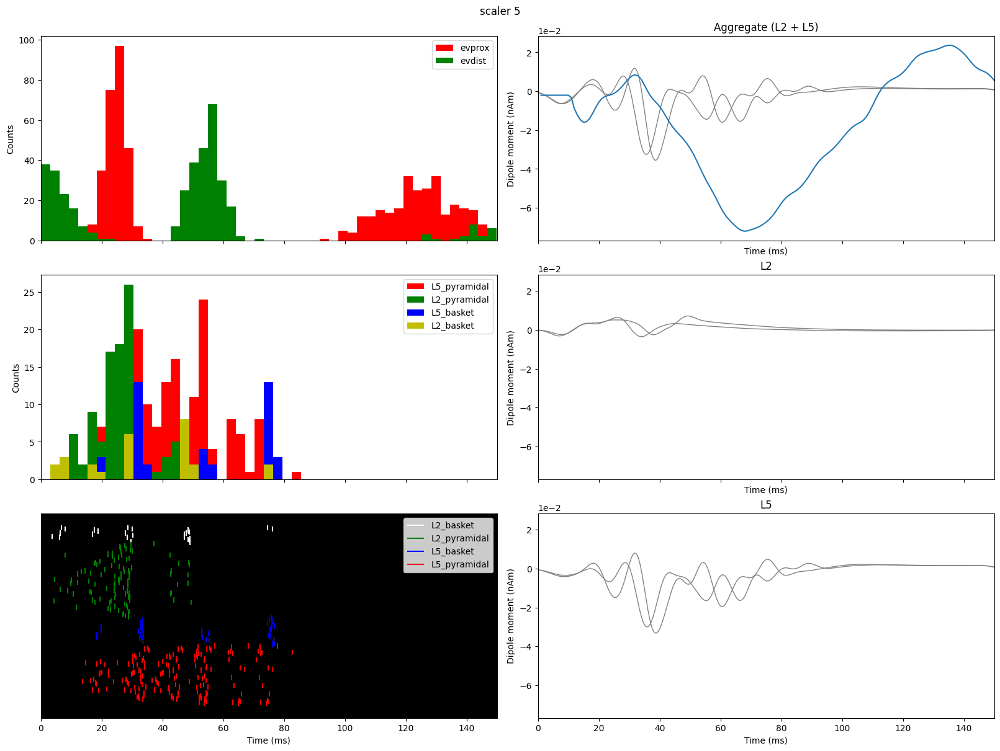

In [ ]:
make_plot(smoothed_dist1_sd_dpl, dist1_sd_net, dist1_sd_scalar, tstop=150)

<h1>Increase strength for just dist1

In [40]:
dist1_strength_scalar = [1e1, 1e2, 1e3, 1e4]
dist1_strength_params = deepcopy(dist1_sd_params)

for params, scalar in zip(dist1_strength_params, dist1_strength_scalar):
    for param in params['gbar_evdist_2*']:
        params[param] = scalar * params[param]
        
    
print(dist1_strength_params[0]['gbar_evdist_2*'])
print(dist1_strength_params[1]['gbar_evdist_2*'])

{
    "gbar_evdist_2_L2Basket_ampa": 0.02217,
    "gbar_evdist_2_L2Basket_nmda": 0.35139,
    "gbar_evdist_2_L2Pyr_ampa": 0.02819,
    "gbar_evdist_2_L2Pyr_nmda": 0.03713,
    "gbar_evdist_2_L5Pyr_ampa": 0.27627,
    "gbar_evdist_2_L5Pyr_nmda": 0.05384
}
{
    "gbar_evdist_2_L2Basket_ampa": 0.22169999999999998,
    "gbar_evdist_2_L2Basket_nmda": 3.5138999999999996,
    "gbar_evdist_2_L2Pyr_ampa": 0.2819,
    "gbar_evdist_2_L2Pyr_nmda": 0.3713,
    "gbar_evdist_2_L5Pyr_ampa": 2.7626999999999997,
    "gbar_evdist_2_L5Pyr_nmda": 0.5384
}


In [41]:
dist1_strength_dpl = []
dist1_strength_net = []

for params in dist1_strength_params:
    dpl, net = make_net_and_simulate(params,tstop=150)
    dist1_strength_dpl.append(dpl)
    dist1_strength_net.append(net)
smoothed_dist1_strength_dpl = scale_and_smooth(dist1_strength_dpl)

MPI will run 2 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Trial 1: 50.0 ms...
Trial 1: 60.0 ms...
Trial 1: 70.0 ms...
Trial 1: 80.0 ms...
Trial 1: 90.0 ms...
T

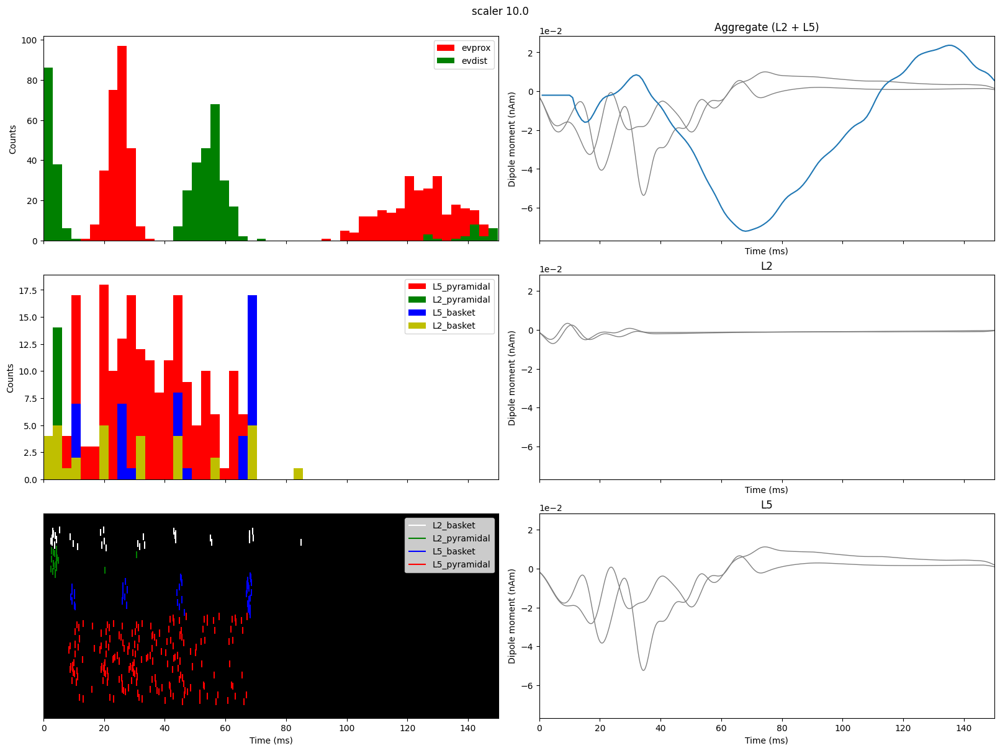

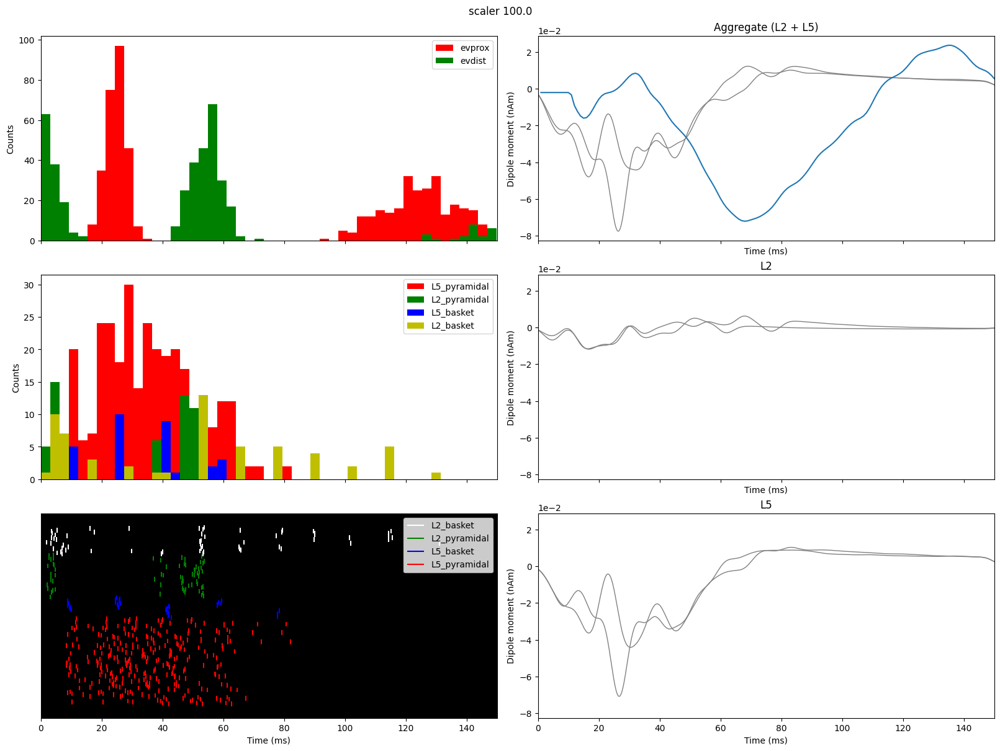

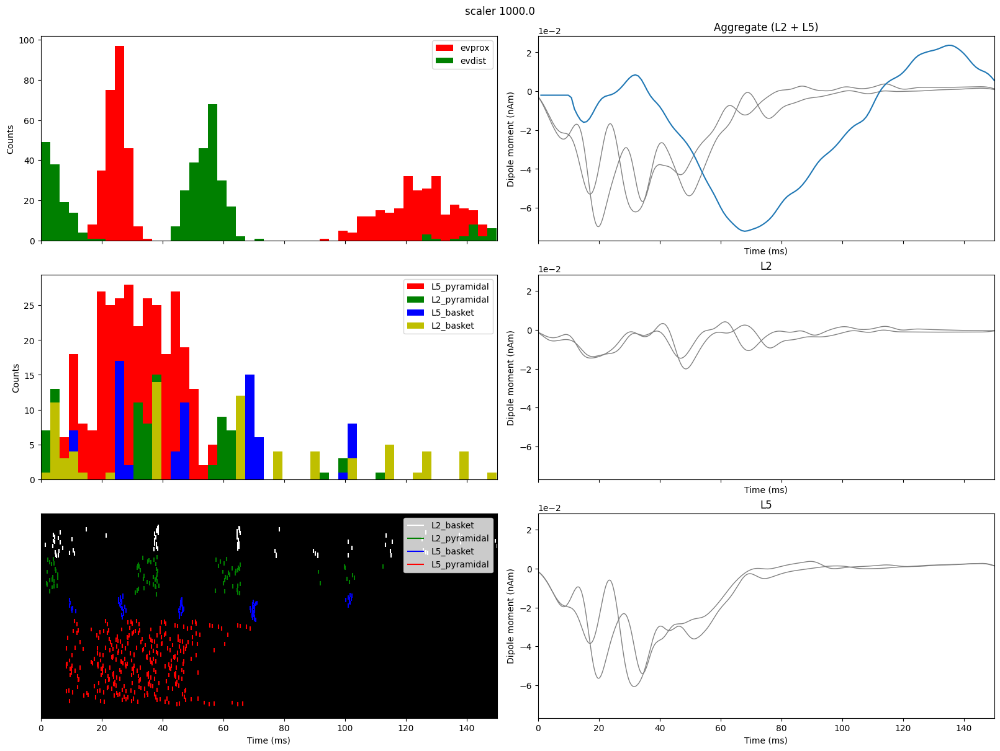

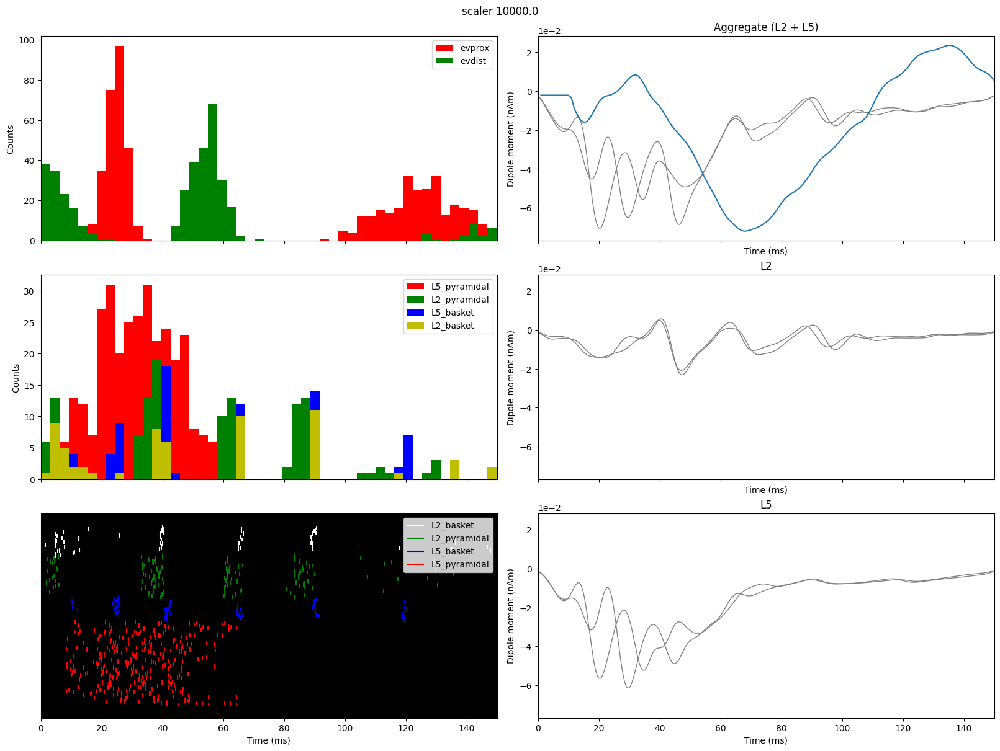

In [42]:
make_plot(smoothed_dist1_strength_dpl, dist1_strength_net, dist1_strength_scalar, tstop=150)

In [48]:
just_dist1_net = calcium_model()

#distal evoked drive
weights_ampa_d1 = {'L2_basket': 0.002217, 'L2_pyramidal': 0.002819,
                'L5_pyramidal': 0.027627}
weights_nmda_d1 = {'L2_basket': 0.035139, 'L2_pyramidal': 0.003713,
                'L5_pyramidal': 0.005384}
synaptic_delays_d1 = {'L2_basket': 5.0, 'L2_pyramidal': 5.0,
                    'L5_pyramidal': 5.0}

just_dist1_net.add_evoked_drive(
    'evdist1', mu=0.528485, sigma=1.434398, numspikes=1, weights_ampa=weights_ampa_d1,
    weights_nmda=weights_nmda_d1, location='distal',
    synaptic_delays=synaptic_delays_d1, event_seed=274)

In [49]:
with MPIBackend(n_procs=2, mpi_cmd='mpiexec'):
    just_dist1_dpl =  simulate_dipole(just_dist1_net, tstop=150, n_trials=4)

MPI will run 4 trial(s) sequentially by distributing network neurons over 2 processes.
numprocs=2
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
/opt/anaconda3/envs/hnn_core/bin/nrniv:10: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import working_set
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
Building the NEURON model
Loading custom mechanism files from /opt/anaconda3/envs/hnn_core/lib/python3.8/site-packages/hnn_core/mod/arm64/.libs/libnrnmech.so
[Done]
Trial 1: 0.03 ms...
Trial 1: 10.0 ms...
Trial 1: 20.0 ms...
Trial 1: 30.0 ms...
Trial 1: 40.0 ms...
Trial 1: 50.0 ms...
Trial 1: 60.0 ms...
Trial 1: 70.0 ms...
Trial 1: 80.0 ms...
Trial 1: 90.0 ms...
T

In [50]:
smoothed_just_dist1_dpl = scale_and_smooth([just_dist1_dpl])

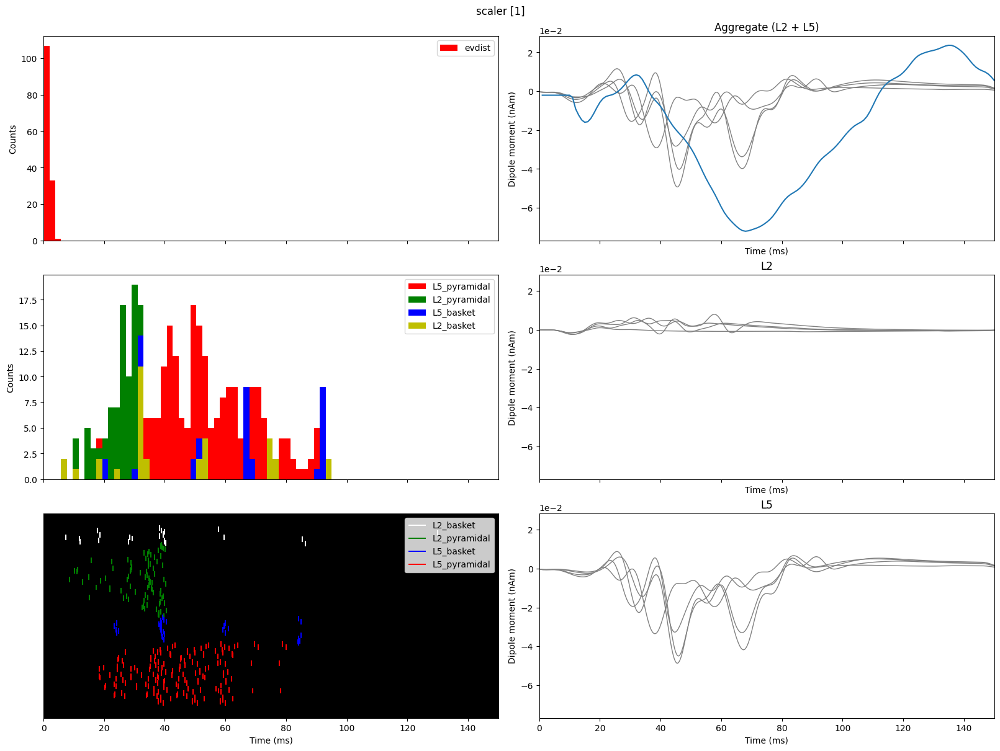

In [51]:
for i in range(len(smoothed_just_dist1_dpl)):
    fig, axes = plt.subplots(3, 2, sharex=True, figsize=(16, 12), constrained_layout=True)

    # plot 1: drives
    just_dist1_net.cell_response.plot_spikes_hist(ax=axes[0][0], spike_types=['evdist'], trial_idx=0, show=False)

    # plot 2: cell response
    just_dist1_net.cell_response.plot_spikes_hist(ax=axes[1][0], spike_types=['L5_pyramidal', 'L2_pyramidal', 'L5_basket', 'L2_basket', ], trial_idx=0, show=False)

    # plot 3: cell spiking
    just_dist1_net.cell_response.plot_spikes_raster(ax=axes[2][0], trial_idx=1, show=False)

    # plot 4: dipole, agg and data 
    plot_dipole(smoothed_just_dist1_dpl[i], ax = axes[0][1], layer='agg', show=False)
    axes[0][1].plot(np.array(partic_data[0][:150]), np.array(partic_data[1][:150])*8)
    axes[0][1].set_xlim(0,150)
    ymin, ymax = axes[0][1].get_ylim()

    # plot 5: dipole, layer 2/3
    plot_dipole(smoothed_just_dist1_dpl[i], ax = axes[1][1], layer='L2', show=False)
    axes[1][1].set_ylim(ymin, ymax)

    # plot 6: dipole, layer 5
    plot_dipole(smoothed_just_dist1_dpl[i], ax = axes[2][1], layer='L5', show=False)
    axes[2][1].set_ylim(ymin, ymax)

    fig.suptitle(f'scaler {[1]}')